# PROYECTO DE CONSOLIDACIÓN: APRENDIZAJE SUPERVISADO (GRUPO 1)

# [EJERCICIO 1]
Bienvenido al año 2912, donde se necesitan tus habilidades de ciencia de datos para resolver un misterio cósmico. Hemos recibido una transmisión desde cuatro años luz de distancia y las cosas no pintan bien.

La nave espacial Alcón Milenario fue un transatlántico de pasajeros interestelar lanzado hace un mes. Con casi 13.000 pasajeros a bordo, la nave emprendió su viaje inaugural transportando emigrantes de nuestro sistema solar a tres exoplanetas recientemente habitables que orbitan estrellas cercanas.

Mientras rodeaba Alpha Centauri en ruta hacia su primer destino, el tórrido 55 Cancri E, la desprevenida nave espacial Alcón Milenario chocó con una anomalía del espacio-tiempo escondida dentro de una nube de polvo. Lamentablemente, tuvo un destino similar al de su homónimo de 1000 años antes. Aunque la nave permaneció intacta, ¡casi la mitad de los pasajeros fueron transportados a una dimensión alternativa!

Para ayudar a las tripulaciones de rescate y recuperar a los pasajeros perdidos, debe predecir qué pasajeros fueron transportados por la anomalía utilizando los registros recuperados del sistema informático dañado de la nave espacial.

¡Ayuda a salvarlos y cambia la historia!

- a) Realiza un análisis exploratorio de los datos para entender la distribución de las diferentes variables.
- b) Procesa los datos para:
  - Detectar y tratar los posibles valores faltantes.
  - Detectar y tratar outliers.
- c) Utiliza las técnicas vistas en clase para detectar las variables más importante con respecto a la variable objetivo (Transported)
- d) Aplica alguna de las técnicas vistas en clase para determinar qué pasajeros fueron transportados y cuales no.
- e) Mejora los resultados optimizando los parámetros.
- f) Compara los resultados obtenidos utilizando modelos de ensemble para resolver el problema.
- g) Selecciona el mejor modelo de los testeados en los apartados anteriores.__

Deberás entrenar y validar el modelo seleccionado sobre el dataset __"spaceship_alcon_train.csv"__ y aplicar posteriormente este modelo para predecir sobre el dataset __"spaceship_alcon_test.csv"__.
Deberás explicar todos los pasos que vayas dando en la resolución del problema.

### 0) Librerías

Cargamos las librerías necesarias:

In [2]:
#Librerías principales
import pandas as pd
import numpy as np
from scipy import stats

#Visualizaciones
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.graph_objects as go
from plotly.subplots           import make_subplots

#Sklearn: preprocesado
from sklearn.model_selection   import train_test_split
from sklearn.compose           import ColumnTransformer
from sklearn.preprocessing     import MinMaxScaler, OneHotEncoder
from sklearn.preprocessing     import FunctionTransformer


#Sklearn: selección de características
from sklearn.feature_selection import chi2

#Sklearn: pipelines
from sklearn.pipeline          import make_pipeline, Pipeline

#Sklearn: modelos
from sklearn.ensemble          import RandomForestClassifier
from sklearn.linear_model      import LogisticRegression
from sklearn.svm               import SVC
from sklearn.naive_bayes       import GaussianNB
from sklearn.tree              import DecisionTreeClassifier
from sklearn.neighbors         import KNeighborsClassifier

#Sklearn: Ensembles
from xgboost                   import XGBClassifier


#Sklearn: evaluación
from sklearn.feature_selection import RFECV
from sklearn.metrics           import make_scorer
from sklearn.metrics           import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics           import classification_report, ConfusionMatrixDisplay
from sklearn.model_selection   import GridSearchCV

#Otras librerías
import time

### a) [DATA EXPLORATION] Realiza un análisis exploratorio de los datos para entender la distribución de las diferentes variables.

Nuestro objetivo es predecir __qué pasajeros fueron transportados__ por la anomalía del espacio-tiempo a una dimensión alternativa.

#### a.1) Carga de los datasets

Cargamos los datasets "spaceship_alcon_train.csv" y "spaceship_alcon_test.csv". Puesto que utilizaremos el dataset __"spaceship_alcon_train.csv"__ para entrenar y validar el modelo lo llamaremos `df_cons`(de construcción) y al segundo, __"spaceship_alcon_test.csv"__ lo llamaremos `df_expl`(de explotación), puesto que lo usaremos para predecir (y no para validar). Esto es importante, puesto que el dataset de explotación no tiene la cola`transported`, por lo que nunca podría ser nuestro `y_test`. `y_test` provendrá del propio dataset de construcción, que el enunciado lo llamaba como "train". 

Además, almacenamos los IDs del dataset de explotación en una variable, ya que son los registros sobre los cuales queremos predecir.

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 25)

df_cons_original = pd.read_csv('./datasets/spaceship_alcon_train.csv')
df_expl_original = pd.read_csv('./datasets/spaceship_alcon_test.csv')

df_cons = df_cons_original.copy()
df_expl = df_expl_original.copy()

#Almacenamos los IDs del dataset de explotación en una variable
IDs_df_expl = df_expl['PassengerId']

Exploramos el dataset para ver la naturaleza de los datos:

In [4]:
df_cons.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


In [5]:
#Información del conjunto de entrenamiento
rows, cols = df_cons.shape
print(f'El conjunto de entrenamiento tiene {rows} filas y {cols} columnas:')
print(f'Columnas en train: {df_cons.columns}')
print('---------------')

#Información del conjunto de test
rows, cols = df_expl.shape
print(f'El conjunto de test tiene {rows} filas y {cols} columnas')
print(f'Columnas en train: {df_expl.columns}')

El conjunto de entrenamiento tiene 8693 filas y 14 columnas:
Columnas en train: Index(['PassengerId', 'HomePlanet', 'CryoSleep', 'Cabin', 'Destination', 'Age',
       'VIP', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck',
       'Name', 'Transported'],
      dtype='object')
---------------
El conjunto de test tiene 4277 filas y 13 columnas
Columnas en train: Index(['PassengerId', 'HomePlanet', 'CryoSleep', 'Cabin', 'Destination', 'Age',
       'VIP', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck',
       'Name'],
      dtype='object')


Unimos los dos dataframes en uno, `df_total`.

In [6]:
df_total = pd.concat([df_cons, df_expl], axis = 0)

#### a.2) Naturaleza de los datos

Como podemos observar, tenemos algunas variables categóricas que tendremos que codificar.

In [7]:
df_cons.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8492 non-null   object 
 2   CryoSleep     8476 non-null   object 
 3   Cabin         8494 non-null   object 
 4   Destination   8511 non-null   object 
 5   Age           8514 non-null   float64
 6   VIP           8490 non-null   object 
 7   RoomService   8512 non-null   float64
 8   FoodCourt     8510 non-null   float64
 9   ShoppingMall  8485 non-null   float64
 10  Spa           8510 non-null   float64
 11  VRDeck        8505 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
dtypes: bool(1), float64(6), object(7)
memory usage: 891.5+ KB


In [8]:
df_expl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4277 entries, 0 to 4276
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   4277 non-null   object 
 1   HomePlanet    4190 non-null   object 
 2   CryoSleep     4184 non-null   object 
 3   Cabin         4177 non-null   object 
 4   Destination   4185 non-null   object 
 5   Age           4186 non-null   float64
 6   VIP           4184 non-null   object 
 7   RoomService   4195 non-null   float64
 8   FoodCourt     4171 non-null   float64
 9   ShoppingMall  4179 non-null   float64
 10  Spa           4176 non-null   float64
 11  VRDeck        4197 non-null   float64
 12  Name          4183 non-null   object 
dtypes: float64(6), object(7)
memory usage: 434.5+ KB


Realizamos una primera descripción estadística. Primero las __variables numéricas__.

In [9]:
df_total.describe()

,Age,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
count,12700.000000,12707.000000,12681.000000,12664.000000,12686.000000,12702.000000
mean,28.771969,222.897852,451.961675,174.906033,308.476904,306.789482
std,14.387261,647.596664,1584.370747,590.558690,1130.279641,1180.097223
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,38.000000,49.000000,77.000000,29.000000,57.000000,42.000000
max,79.000000,14327.000000,29813.000000,23492.000000,22408.000000,24133.000000


A destacar:
- En estas variables numéricas, no existen valores __negativos__, algo bueno porque de lo contrario serían valores atípicos.
- En la variable `Age` la desviación estándar es de 14.39.
- En las variables de gasto (el resto), la desviación estándar es algo elevada, por lo que hay una gran diferencia entre los valores máximos y los mínimos con respecto a la media.

Y ahora las __varaibles categóricas__:

In [10]:
df_total.describe(include = object)

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,VIP,Name,Transported
count,12970,12682,12660,12671,12696,12674,12676,8693
unique,12970,3,2,9825,3,2,12629,2
top,0001_01,Earth,False,G/734/S,TRAPPIST-1e,False,Carry Contrevins,True
freq,1,6865,8079,8,8871,12401,2,4378


A destacar:
- En la nave viajaban __12970 pasajeros__.
- `PassengerId` será un buen identificador de cada pasajero, ya que no se repite.
- De `name` se deduce que existen pasajeros con el mismo nombre y pasajeros cuyo nombre falta en el registro.
- `Transported`, `Cryosleep` y `VIP` serán variables booleanas. 
- `HomePlanet` y `Destination` serán variables categóricas fácilmente codificables.
- `Cabin` habrá que tratarla y transformarla para reducir su cardinalidad. 

Visualizamos el total de datos faltantes del `df_total`. Vemos que tenemos datos faltantes en casi todas las colas.

In [11]:
df_total.isnull().sum()

PassengerId        0
HomePlanet       288
CryoSleep        310
Cabin            299
Destination      274
Age              270
VIP              296
RoomService      263
FoodCourt        289
ShoppingMall     306
Spa              284
VRDeck           268
Name             294
Transported     4277
dtype: int64

#### a.3) Preprocesado de los datos

En un principio realizamos la transformación a `snake_case` del nombre de las variables, pero luego desestimamos esta opción.

#### a.4) Cardinalidad de las variables

Creamos una función que nos imprima el número de valores únicos de cada variable categórica (cardinalidad de la variable), a excepción de `Passenger ID` y`name`. Esto nos es útil para ver que aproximación elegimos para codificar las variables, asicomo aquellas colas que puedan tener demasiados valores únicos.

In [12]:
def count_unique_values(df):
    for col in df.columns:
        if col in ["PassengerId", "Name"]:
            continue
        if df[col].dtype == object:
            number_values = df[col].nunique()
            print(f'La columna "{col}" tiene {number_values} posibles valores únicos.')

In [13]:
count_unique_values(df_total)

La columna "HomePlanet" tiene 3 posibles valores únicos.
La columna "CryoSleep" tiene 2 posibles valores únicos.
La columna "Cabin" tiene 9825 posibles valores únicos.
La columna "Destination" tiene 3 posibles valores únicos.
La columna "VIP" tiene 2 posibles valores únicos.
La columna "Transported" tiene 2 posibles valores únicos.


#### a.5) Valores duplicados

Creamos una función que nos sirva para imprimir los datos duplicados:

In [14]:
def print_duplicates(df, df_name):
    '''
    Imprime un resumen de los valores duplicados de un dataset
    
    Args:
        df (DataFrame): DataFrame a analizar
        df_name (str): Nombre del DataFrame
    
    '''
    if df.duplicated().sum() == 0:
        print(f'El {df_name} no tiene valores duplicados.')
    else:
        print(f'Valores duplicados en el dataset {df_name}:')
        print(df.duplicated().sum())


Comprobamos los valores duplicados del `dataset de construcción`y el `dataset de explotación`.

In [15]:
print_duplicates(df_cons, 'Dataset de construcción')
print_duplicates(df_expl, 'Dataset de explotación')

El Dataset de construcción no tiene valores duplicados.
El Dataset de explotación no tiene valores duplicados.


#### a.6) Transformación de variables

##### a.6.1) Variable `cabin`

Como podemos observar, todas las variables categóricas tienen 2 o 3 valores únicos, a excepción de la variable `cabin`. En un primer momento, pensamos en la posibilidad de eliminar la columna, ya que los 9825 posibles valores harian dificil su codificación y posiblemente no aporte información.

Sin embargo, observemos un ejemplo de 10 muestras de la variable `cabin`:

In [16]:
df_cons.sample(10)['Cabin']

1524      D/53/P
3466      A/43/S
1635     G/281/P
3422     F/697/S
563       E/35/P
7658    G/1316/S
7453     C/259/P
5226    F/1156/P
3758     F/761/S
6405    F/1294/S
Name: Cabin, dtype: object

Apreciamos que el string de `cabin` está compuesto por `LETRA`/ `NÚMERO`/ `LETRA`. 

    - El primer campo es una letra que suponemos que será una región determinada de la nave.
    - El segundo campo es un número que también estará relacionado con la ubicación de la cabina.
    - El tercer campo, suponemos que se refiere a `Port`o `Starboard` (babor o estribor).
    
Aplicamos un slicing y almacenamos cada valor en una variable.

In [17]:
#Slicing y almacenamos cada valor en una variable
df_cons[['Cabin_Letter', 'Cabin_Number', 'Cabin_Side']] = df_cons['Cabin'].str.split('/', expand=True)
df_expl[['Cabin_Letter', 'Cabin_Number', 'Cabin_Side']] = df_expl['Cabin'].str.split('/', expand=True)

# Eliminar la columna original 'Cabin'
df_cons.drop(columns='Cabin', inplace=True)
df_expl.drop(columns='Cabin', inplace=True)

Vemos que la mayoría de los pasajeros viaja en las cabinas comprendidas entre el número 0 y el 500.

__El objetivo es tener todas las variables categóricas para trabajar más fácilmente con los modelos de selección de variables y métricas de calidad__.

Los valores de `Cabin_Number` van desde el 0 hasta el 1894. Estableceremos cinco intervalos. Primero Visualizaremos la distribución de `Cabin_Number` tanto del dataset de `construcción` como del de `explotación`. 

Después, utilizaremos la función de Pandas `cut` para establecer intervalos y así categorizar la variable.

/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Cabin_Number', ylabel='Density'>

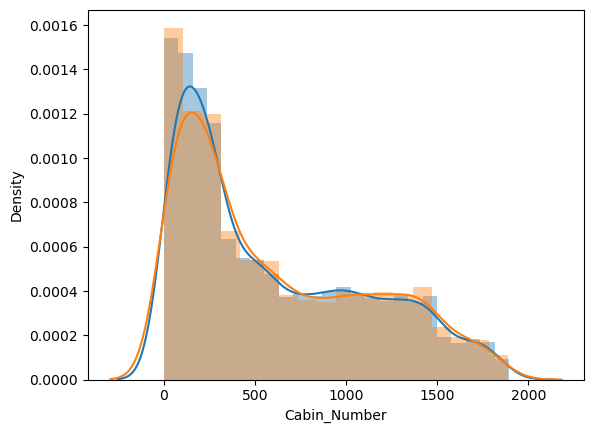

In [18]:
sns.distplot(df_cons['Cabin_Number'])
sns.distplot(df_expl['Cabin_Number'])

In [19]:
# Creamos intervalos para la variable Cabin_Number en el dataset de construcción
df_cons['Cabin_Number'] = pd.cut(x = df_cons['Cabin_Number'].astype(float),
                                bins = 5,
                                right = True,
                                labels = ['Zona 1', 'Zona 2', 'Zona 3', 'Zona 4', 'Zona 5']
      )

# Creamos intervalos para la variable Cabin_Number en el dataset de explotación
df_expl['Cabin_Number'] = pd.cut(x = df_expl['Cabin_Number'].astype(float),
                                bins = 5,
                                right = True,
                                labels = ['Zona 1', 'Zona 2', 'Zona 3', 'Zona 4', 'Zona 5']
      )

Visualizamos ahora como ha quedado la distribución de esta variable mediante un `displot` de la librería `seaborn`.

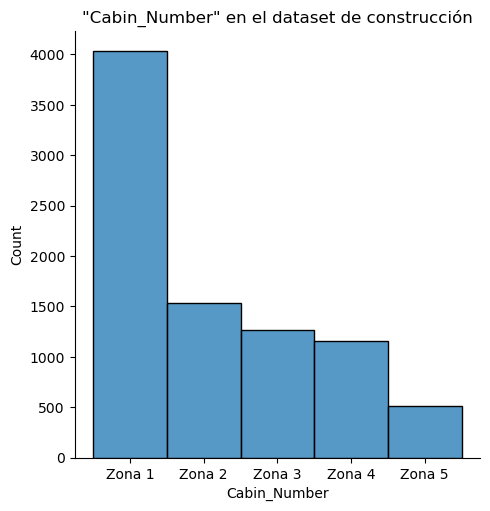

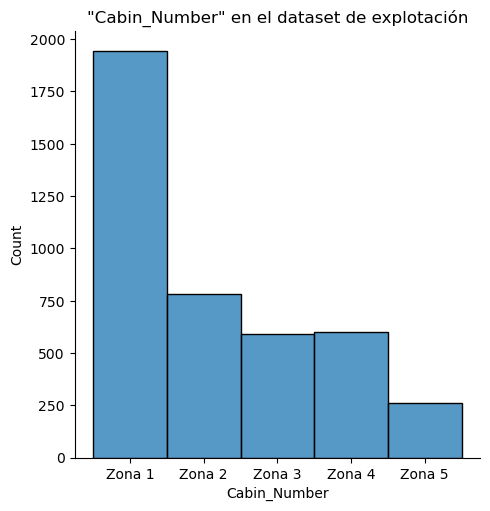

In [20]:
#Cabin_Number en el dataset de construcción
sns.displot(df_cons['Cabin_Number'])
plt.title('"Cabin_Number" en el dataset de construcción')

#Cabin_Number en el dataset de explotación
sns.displot(df_expl['Cabin_Number'])
plt.title('"Cabin_Number" en el dataset de explotación');

Visualizamos la distribución de los pasajeros entre babor y estribor de la nave (`starboard`y `port`)

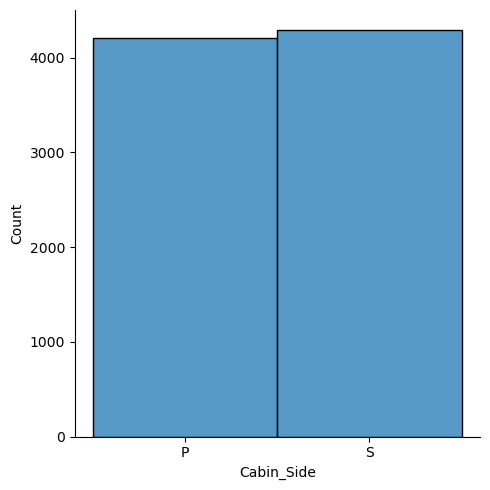

In [21]:
sns.displot(df_cons['Cabin_Side']);

#### a.7) Visualizaciones de distribuciones de datos

##### a.7.1) Histograma de las variables

Comenzaremos realizando un histograma para las variables continuas y entender sus distribuciones. Lo haremos usando el __dataset de entrenamiento__, puesto que ofrece una visión adecuada de la variabilidad de los datos y nos permite analizar la forma y dispersión de las distribuciones de las variables. 

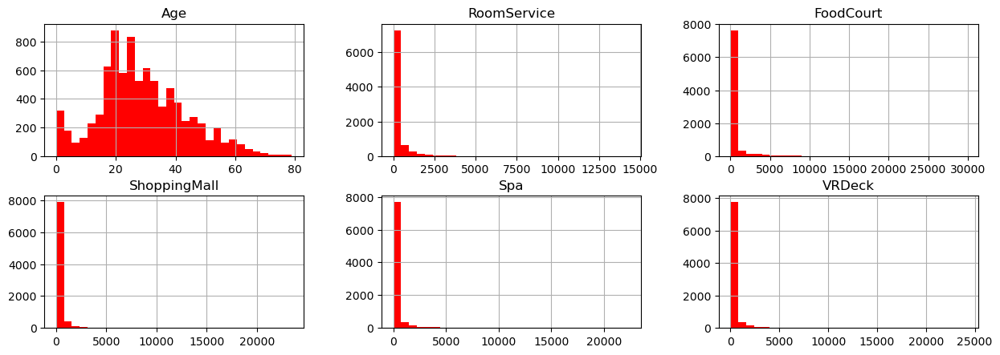

In [22]:
df_cons.hist(color = 'red', bins = 30, layout = (11,3), figsize = (15,30));

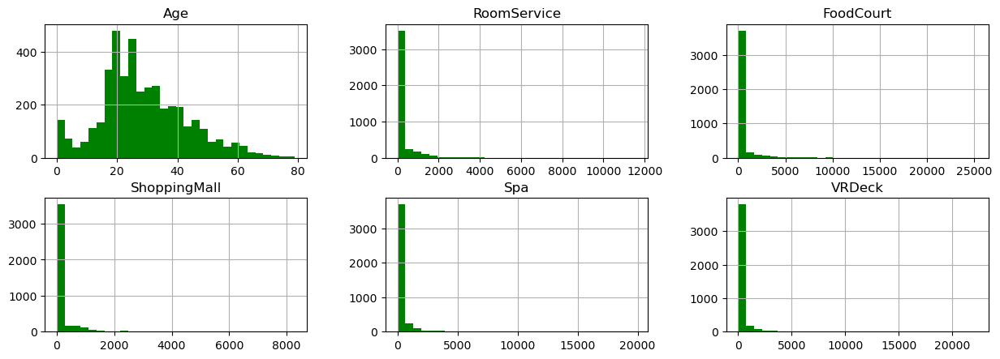

In [23]:
df_expl.hist(color = 'green', bins = 30, layout = (11,3), figsize = (15,30));

##### a.7.2) Countplot de variables categóricas

In [24]:
df_cons.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   PassengerId   8693 non-null   object  
 1   HomePlanet    8492 non-null   object  
 2   CryoSleep     8476 non-null   object  
 3   Destination   8511 non-null   object  
 4   Age           8514 non-null   float64 
 5   VIP           8490 non-null   object  
 6   RoomService   8512 non-null   float64 
 7   FoodCourt     8510 non-null   float64 
 8   ShoppingMall  8485 non-null   float64 
 9   Spa           8510 non-null   float64 
 10  VRDeck        8505 non-null   float64 
 11  Name          8493 non-null   object  
 12  Transported   8693 non-null   bool    
 13  Cabin_Letter  8494 non-null   object  
 14  Cabin_Number  8494 non-null   category
 15  Cabin_Side    8494 non-null   object  
dtypes: bool(1), category(1), float64(6), object(8)
memory usage: 968.1+ KB


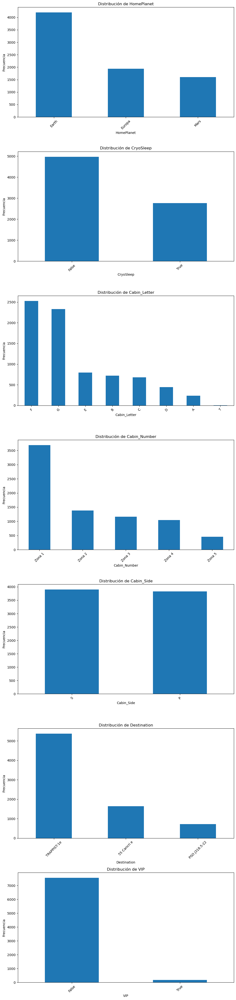

In [25]:
# Lista de nombres de las variables categóricas
categoricas = ['HomePlanet', 'CryoSleep', 'Cabin_Letter', 'Cabin_Number', 'Cabin_Side', 'Destination', 'VIP']

# Filtramos un dataset con los valores faltantes eliminados solo en las columnas categóricas
df_cons_cleaned = df_cons.dropna(subset=categoricas)

# Creamos una figura y ejes para los subplots
fig, axes = plt.subplots(nrows=len(categoricas), ncols=1, figsize=(10, 6 * len(categoricas)))

# Generamos subplots para cada variable categórica
for i, var in enumerate(categoricas):
    ax = axes[i]
    df_cons_cleaned[var].value_counts().plot(kind='bar', ax=ax)
    ax.set_title(f'Distribución de {var}')
    ax.set_xlabel(var)
    ax.set_ylabel('Frecuencia')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


##### a.7.3) Distribución de la variable objetivo

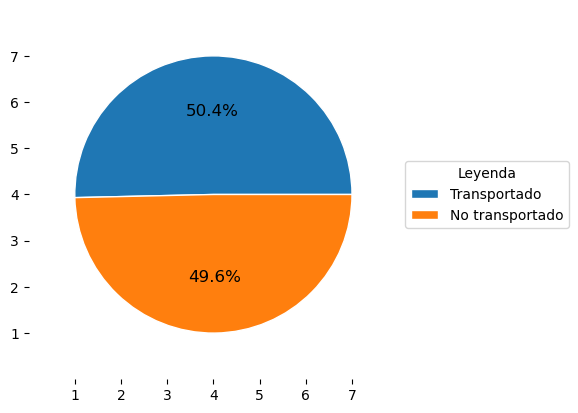

In [26]:
#Definimos las etiquetas de la variable objetivo
labels = ['Transportado', 'No transportado']

# Crear la figura y los ejes
fig, ax = plt.subplots()

# Graficar el gráfico de pie
wedges, texts, autotexts = ax.pie(df_cons['Transported'].value_counts(), radius=3, center=(4, 4),
                                  wedgeprops={"linewidth": 1, "edgecolor": "white"},
                                  autopct='%1.1f%%', textprops={'fontsize': 12})

# Agregar leyenda personalizada
ax.legend(wedges, labels, title="Leyenda", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Ajustar límites de los ejes
ax.set(xlim=(0, 8), xticks=np.arange(1, 8),
       ylim=(0, 8), yticks=np.arange(1, 8))

plt.show()

Observamos que los __datos están balanceados__, por lo que posteriormente en la construcción del modelo no será necesario aplicar técnicas de oversampling / undersampling.

##### a.7.4) Distribución de variables frente a variable objetivo

A continuación, generaremos gráficos de las distribuciones de cada una de las variables del dataset en función de la variable objetivo `Transported`. Para aquellas variables que sean booleanas utilizaremos un `countplot` y para las demás un `distplot` de la librería `seaborn`.

Empezamos visualizando las variables numéricas frente a `Transported`. Veremos primero la variable `Age` y posteriormente las variables de gasto, por tener una naturaleza diferente.

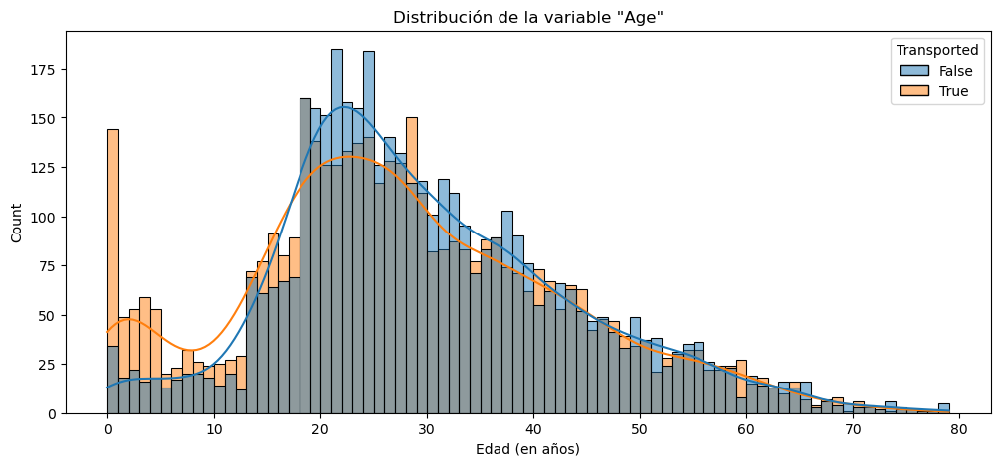

In [27]:
plt.figure(figsize = (12, 5))

sns.histplot(df_cons, x = 'Age', hue = 'Transported', binwidth = 1, kde = True)

plt.title('Distribución de la variable "Age"')
plt.xlabel('Edad (en años)');

Ahora visualizaremos las variables de gasto(`RoomService`, `FoodCourt`, `ShoppingMall`, `Spa`, `VRDeck`) frente a `Transported`.

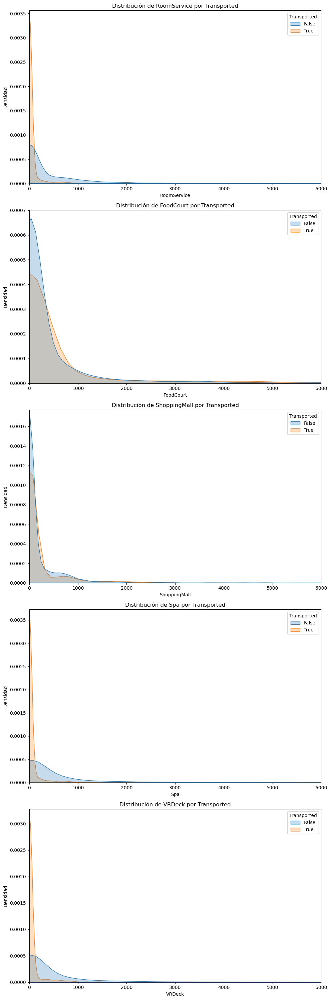

In [28]:
# Filtramos un dataset con los valores faltantes eliminados solo en las columnas numéricas
df_cons_cleaned = df_cons.dropna(subset=['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck'])

# Lista de nombres de las variables numéricas
vars_gasto = ['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']

# Creamos una figura y ejes para los subplots
fig, axes = plt.subplots(nrows=len(vars_gasto), ncols=1, figsize=(10, 6 * len(vars_gasto)))

# Generamos subplots para cada variable numérica frente a la variable categórica "Transported"
for i, var in enumerate(vars_gasto):
    ax = axes[i]
    sns.kdeplot(data = df_cons_cleaned, x = var, hue = 'Transported', ax = ax, fill = True)
    ax.set_title(f'Distribución de {var} por Transported')
    ax.set_xlabel(var)
    ax.set_ylabel('Densidad')
    
    ax.set_xlim(0, 6000)  # Ajustamos un límite para visualizar mejor los gráficos

plt.tight_layout()
plt.show()

##### a.7.5) Insights

De este análisis exploratorio, ganamos una serie de _insights_ sobre nuestro Dataset:
- Hay una relación elevada entre la variable `cryosleep` y haber sido transportado a la realidad alternativa.
- Parece haber una relación notable entre haber realizado gasto alguno y haber sido transportado.
- La gran mayoría de pasajeros no realizan gasto.

Sobre la variable `Age` (edad):
- Los pasajeros entre 0 y 18 años han sido __más__ transportados que la media.
- Los pasajeros entre 18 y 25 años han sido __menos__ que la media.
- Los pasajeros de más de 25 años han sido igualmente transportados.
- No parece haver datos atípicos.

Sobre las variables de gasto:
- La mayoría de pasajeros gastan pocas cantidades.
- Hay algunos pasajeros que realizan gastos muy elevados.

Sobre la variable objetivo `Transported`:
- Vemos que los datos están muy balanceados, por lo que no será necesario realizar técnicas de _overfitting_ o _underfitting_.



### b) [FEATURE CLEANING] Procesa los datos para detectar y tratar los posibles valores faltantes y detectar y tratar outliers.

#### b.1) Análisis de valores faltantes

Creamos una función que nos muestre los valores NaN numéricos y de porcentaje de cada colas en una tabla para poder tener una información más completa y comprobar pequeñas variaciones. Además, agregamos una fila `total` para ver los valores totales del DF.



In [29]:
pd.set_option('display.max_rows', None)

def calculate_nan_stats(df):
    """
    Muestra las estadísticas (número y porcentaje) de valores NaN por cola de un DF y el total.

    Args:
        df (DataFrame): DataFrame de Pandas.

    Return:
        Retorna un DF con index de colas del DF origen, 2 colas (nan_count, nan_percentage) y una row del total.

    """
  
    nan_count = df.isna().sum() # Numero de nan total por cola  
    nan_percentage = round(df.isna().mean(), 4) * 100 # Porcentaje de nan total por cola // .isna = .isnull  // = nan_percentage = df.isna().mean().round(4) * 100

    nan_df = pd.concat({'nan_count': nan_count, 'nan_percentage': nan_percentage}, axis = 1)


    nan_df.loc['Total'] = [nan_count.sum(), round(nan_percentage.mean(), 2)] # Nueva row con el total de nan_count y la media de nan_percentage

    return nan_df

##### Comprobamos cuantas filas poseen al menos un dato faltante por si pudiéramos eliminar filas con datos faltantes

In [30]:
# Comprobamos número de filas con al menos un dato faltante
filas_cons_nan = df_cons.isnull().any(axis=1).sum()
porcentaje_faltante = (filas_cons_nan / len(df_cons)) * 100

print (f' En el DataFrame "df_cons" ({df_cons.shape[0]} filas, {df_cons.shape[1]} columnas):')
print (f' - Nos encontramos con al menos un dato faltante en {filas_cons_nan}')
print(f' - Lo cual supone que en un {porcentaje_faltante:.2f}% de las filas tenemos un dato faltante.')


 En el DataFrame "df_cons" (8693 filas, 16 columnas):
 - Nos encontramos con al menos un dato faltante en 2087
 - Lo cual supone que en un 24.01% de las filas tenemos un dato faltante.


In [31]:
# Compruebo número de filas con al menos un dato faltante
filas_expl_nan = df_expl.isnull().any(axis=1).sum()
porcentaje_faltante = (filas_expl_nan / len(df_expl)) * 100

print (f' En el DataFrame "df_cons" ({df_expl.shape[0]} filas, {df_expl.shape[1]} columnas):')
print (f' - Nos encontramos con al menos un dato faltante en {filas_expl_nan}')
print(f' - Lo cual supone que en un {porcentaje_faltante:.2f}% de las filas tenemos un dato faltante.')

 En el DataFrame "df_cons" (4277 filas, 15 columnas):
 - Nos encontramos con al menos un dato faltante en 996
 - Lo cual supone que en un 23.29% de las filas tenemos un dato faltante.


Observamos que el 24% de las filas poseen datos faltantes por lo que no podemos eliminar ninguna fila.

In [32]:
calculate_nan_stats(df_cons)

,nan_count,nan_percentage
PassengerId,0.0,0.00
HomePlanet,201.0,2.31
CryoSleep,217.0,2.50
Destination,182.0,2.09
Age,179.0,2.06
VIP,203.0,2.34
RoomService,181.0,2.08
FoodCourt,183.0,2.11
ShoppingMall,208.0,2.39
Spa,183.0,2.11


Mostramos los valores faltantes del dataset de test:

In [33]:
calculate_nan_stats(df_expl)

,nan_count,nan_percentage
PassengerId,0.0,0.00
HomePlanet,87.0,2.03
CryoSleep,93.0,2.17
Destination,92.0,2.15
Age,91.0,2.13
VIP,93.0,2.17
RoomService,82.0,1.92
FoodCourt,106.0,2.48
ShoppingMall,98.0,2.29
Spa,101.0,2.36


Como podemos observar, hay valores faltantes en todas las columnas menos `PassengerId`. Hay una media del 2% tanto en el conjunto de construcción como en el de explotación. 

#### b.2) Limpieza de valores faltantes

Es importante hacerlo antes de categorizar o trabajar con el DataFrame. 

##### Columna `HomePlanet`

En la columna nombre procedemos a quedarnos con los apellidos. Los apellidos son característicos de localizaciones geográficas. 

Por lo que, tras la realización de pruebas, rellenaremos los datos faltantes de la variable `HomePlanet` en función de su apellido

In [34]:
# Creamoos la variable 'Last_Name' para comprobar si el apellido guarda relación con homeplanet
df_cons['Last_Name'] = df_cons['Name'].str.split().str[1]
df_expl['Last_Name'] = df_expl['Name'].str.split().str[1]

df_cons.head(3)

,PassengerId,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported,Cabin_Letter,Cabin_Number,Cabin_Side,Last_Name
0,0001_01,Europa,False,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False,B,Zona 1,P,Ofracculy
1,0002_01,Earth,False,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True,F,Zona 1,S,Vines
2,0003_01,Europa,False,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False,A,Zona 1,S,Susent


In [35]:
# Comprobamos cuántos valores únicos existen para los apellidos
df_cons['Last_Name'].nunique()
print(df_cons['Last_Name'].nunique())

2217


In [36]:
# Comprobamos que apellidos se repiten en mayor medida
df_cons['Last_Name'].value_counts()
df_cons['Last_Name'].value_counts().head(20)

Casonston      18
Oneiles        16
Domington      15
Litthews       15
Browlerson     14
Garnes         14
Cartez         14
Fulloydez      14
Hinglendez     13
Distured       13
Briggston      13
Barbes         13
Moodman        13
Gibbsonton     13
Vandan         12
Fowlesterez    12
Loway          12
Vloaf          12
Gainney        12
Hanner         12
Name: Last_Name, dtype: int64

Comprobamos si todos los pasajeros con el mismo apellido provienen del mismo planeta (`HomePlanet`)

In [37]:
df_total = pd.concat([df_cons, df_expl])

/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Distintos valores de "HomePlanet" por apellido')

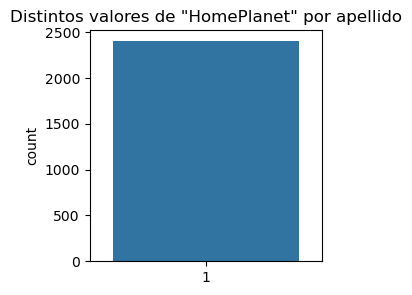

In [38]:
# Vemos cuantos valores tenemos al agrupar el dataframe por 'Last_Name' y 'HomePlanet'
homeplanets = df_total.groupby(['Last_Name','HomePlanet'])['HomePlanet'].size().unstack().fillna(0)

# Visualizamos el tamaño de los valores de 'HomePlanet'
plt.figure(figsize = (3, 3))
sns.countplot((homeplanets > 0).sum(axis=1))
plt.title('Distintos valores de "HomePlanet" por apellido')

Acabamos de comprobar que los apellidos son característicos del origen `HomePlanet`. Por esta razón procededemos a rellenar datos faltantes en `HomePlanet` según el apellido, en concreto, según la moda del apellido.

In [39]:
def impute_homeplanet(df):
    # Limpiamos los espacios en blanco alrededor de los valores en la columna 'Last_Name'
    df['Last_Name'] = df['Last_Name'].str.strip()

    # Creamos un diccionario para almacenar los valores de 'HomePlanet' por apellido
    homeplanet_by_last_name = {}

    # Iteramos por cada fila del DataFrame
    for _, row in df.iterrows():
        last_name = row['Last_Name']
        homeplanet = row['HomePlanet']

        # Verificamos que el apellido no esté vacío y el valor de 'HomePlanet' no sea nulo
        if last_name and pd.notnull(homeplanet):
            # Si no hemos registrado un valor para este apellido, lo almacenamos
            if last_name not in homeplanet_by_last_name:
                homeplanet_by_last_name[last_name] = homeplanet

    # Definimos una función lambda que rellena los valores faltantes de 'HomePlanet' con el valor del apellido correspondiente
    fill_missing_homeplanet = lambda row: homeplanet_by_last_name.get(row['Last_Name'], row['HomePlanet'])

    # Rellenamos los valores faltantes de 'HomePlanet' utilizando la función lambda
    df['HomePlanet'] = df.apply(fill_missing_homeplanet, axis=1)

    return df

Aplicamos esta función a la unión de los dos dataframes, después dividiremos los dos dataframes de nuevo para actualizar `df_cons`y `df_expl`:

In [40]:
df_total['Transported'].isna().sum() # los valores faltantes en 'Transported' en df_total coinciden con el df_expl

4277

In [41]:
impute_homeplanet(df_total) # Aplicamos la función de imputación por apellido al df_total

df_total.isna().sum()

PassengerId        0
HomePlanet         7
CryoSleep        310
Destination      274
Age              270
VIP              296
RoomService      263
FoodCourt        289
ShoppingMall     306
Spa              284
VRDeck           268
Name             294
Transported     4277
Cabin_Letter     299
Cabin_Number     299
Cabin_Side       299
Last_Name        294
dtype: int64

Genial! Hemos rellenado la mayoría de los valores de `HomePlanet`. Veamos ahora cuales son los pasajeros que faltan por rellenar su valor de `HomePlanet`.

Son 7 los pasajeros que falta por rellenar el valor de `HomePlanet`.

In [42]:
df_total[df_total['HomePlanet'].isna()]

,PassengerId,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported,Cabin_Letter,Cabin_Number,Cabin_Side,Last_Name
234,0251_01,NaN,True,55 Cancri e,54.0,False,0.0,0.0,0.0,0.0,0.0,Diphah Amsive,True,C,Zona 1,S,Amsive
807,0853_01,NaN,True,55 Cancri e,38.0,False,0.0,0.0,0.0,0.0,0.0,Hamelik Ageurante,True,A,Zona 1,S,Ageurante
2631,2817_01,NaN,False,TRAPPIST-1e,25.0,False,237.0,0.0,910.0,0.0,12.0,Sealfs Sutty,False,F,Zona 2,P,Sutty
276,0616_01,NaN,False,TRAPPIST-1e,31.0,False,0.0,428.0,NaN,1154.0,1025.0,Arkaban Spriney,NaN,E,Zona 1,S,Spriney
1890,4052_01,NaN,False,TRAPPIST-1e,26.0,False,6.0,5903.0,0.0,240.0,72.0,Ankabih Coneveseng,NaN,D,Zona 1,P,Coneveseng
3220,7065_01,NaN,True,TRAPPIST-1e,28.0,False,0.0,0.0,0.0,0.0,NaN,Zedares Maltorted,NaN,E,Zona 2,S,Maltorted
4032,8775_01,NaN,True,TRAPPIST-1e,40.0,False,0.0,0.0,0.0,0.0,0.0,Raston Maltorted,NaN,D,Zona 1,P,Maltorted


Ahora dividimos de nuevo el dataset para tener actualizado `df_cons`y `df_expl`con la mayoría de los valores faltantes de `HomePlanet` relleno. Para ello, comprobamos cual es el último pasajero del dataset de construcción y cual es el primero del dataset de explotación:

In [43]:
df_cons.tail(1)

,PassengerId,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported,Cabin_Letter,Cabin_Number,Cabin_Side,Last_Name
8692,9280_02,Europa,False,TRAPPIST-1e,44.0,False,126.0,4688.0,0.0,0.0,12.0,Propsh Hontichre,True,E,Zona 2,S,Hontichre


In [44]:
df_expl.head(1)

,PassengerId,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Cabin_Letter,Cabin_Number,Cabin_Side,Last_Name
0,0013_01,Earth,True,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0,Nelly Carsoning,G,Zona 1,S,Carsoning


El primer pasajero del dataset de construcción se trata de:

In [45]:
df_total.iloc[8693]

PassengerId             0013_01
HomePlanet                Earth
CryoSleep                  True
Destination         TRAPPIST-1e
Age                        27.0
VIP                       False
RoomService                 0.0
FoodCourt                   0.0
ShoppingMall                0.0
Spa                         0.0
VRDeck                      0.0
Name            Nelly Carsoning
Transported                 NaN
Cabin_Letter                  G
Cabin_Number             Zona 1
Cabin_Side                    S
Last_Name             Carsoning
Name: 0, dtype: object

En un último esfuerzo por rellenar los 7 valores faltantes de `HomePlanet`, probamos si podemos establecer alguna relación con `Destination`. Para ello,  agruparemos por `HomePlanet` y `Destination`:

In [46]:
# Agrupamos por 'HomePlanet' y 'Destination'
df_total.groupby(['HomePlanet','Destination'])['Destination'].size().unstack()

Destination,55 Cancri e,PSO J318.5-22,TRAPPIST-1e
HomePlanet,,,
Earth,980,1056,4666
Europa,1312,29,1730
Mars,347,99,2470


Observamos que hay una alta correlación entre `Earth` y `TRAPPIST-1e`, sin embargo, no podemos asumir imputar todos los valores de `HomePlanet` según su `Destination` ya que eso haría imputarlos todos por `TRAPPIST-1e`.

Probamos de agrupar `HomePlanet`según el lado de la nave (`Cabin_Side`)

In [47]:
df_total.groupby(['HomePlanet','Cabin_Side']).size().unstack()

Cabin_Side,P,S
HomePlanet,,
Earth,3366,3325
Europa,1441,1608
Mars,1480,1444


Probamos de agrupar `HomePlanet`con `Cabin_Letter`:

In [48]:
df_total.groupby(['HomePlanet','Cabin_Letter']).size().unstack()

Cabin_Letter,A,B,C,D,E,F,G,T
HomePlanet,,,,,,,,
Earth,NaN,NaN,NaN,NaN,582.0,2423.0,3686.0,NaN
Europa,345.0,1117.0,1083.0,297.0,197.0,NaN,NaN,10.0
Mars,8.0,24.0,18.0,421.0,542.0,1815.0,95.0,1.0


De aquí concluimos que:
- Si viene de `Earth` no estará en las cabinas A, B, C, D o T.
- Si viene de `Europa` no estará en F o G.
- Si viene de `Mars` puede estar en cualquiera. 

Decidimos rellenar los datos faltantes de estos 7 pasajeros uno a uno según el tipo de cabina con más pasajero provenientes de ese planeta:

Estos son los pasajeros a imputar su valor de `HomePlanet`:

In [49]:
df_total[df_total['HomePlanet'].isna()][['PassengerId', 'HomePlanet', 'Destination', 'Cabin_Letter', 'Last_Name']]

,PassengerId,HomePlanet,Destination,Cabin_Letter,Last_Name
234,0251_01,NaN,55 Cancri e,C,Amsive
807,0853_01,NaN,55 Cancri e,A,Ageurante
2631,2817_01,NaN,TRAPPIST-1e,F,Sutty
276,0616_01,NaN,TRAPPIST-1e,E,Spriney
1890,4052_01,NaN,TRAPPIST-1e,D,Coneveseng
3220,7065_01,NaN,TRAPPIST-1e,E,Maltorted
4032,8775_01,NaN,TRAPPIST-1e,D,Maltorted


In [50]:
#Filtramos los pasajeros con valores faltantes en 'HomePlanet'
missing_homeplanet = df_total[df_total['HomePlanet'].isna()]

#Asignamos las cabinas uno a uno según las reglas
for _, passenger in missing_homeplanet.iterrows():
    cabin = passenger['Cabin_Letter']  # Obtener la cabina del pasajero
    
    # Asignar 'HomePlanet' según la cabina
    if cabin in ['A', 'B', 'C', 'D', 'T']:
        assigned_planet = 'Earth'  # Elegimos 'Earth' para pasajeros en las cabinas A, B, C, D o T
    elif cabin in ['F', 'G']:
        assigned_planet = 'Europa'  # Elegimos 'Europa' para pasajeros en las cabinas F o G
    else:
        assigned_planet = 'Mars'  # Elegimos 'Mars' para pasajeros en cualquier otra cabina
    
    # Usar loc para asignar el planeta de origen al pasajero
    df_total.loc[passenger.name, 'HomePlanet'] = assigned_planet

In [51]:
df_total.isna().sum()

PassengerId        0
HomePlanet         0
CryoSleep        310
Destination      274
Age              270
VIP              296
RoomService      263
FoodCourt        289
ShoppingMall     306
Spa              284
VRDeck           268
Name             294
Transported     4277
Cabin_Letter     299
Cabin_Number     299
Cabin_Side       299
Last_Name        294
dtype: int64

¡Ya está! No hay datos faltantes en `HomePlanet`.

__IMPORTANTE:__ Dividimos `df_total` y eliminamos la columna `Transported` en el dataset de `explotación`, ya que al unirlos se rellenó con `NaN` en todos los registros de `explotación`, y es precisamente lo que queremos __predecir__.

In [52]:
df_cons = df_total[0:8693].copy() # Hacemos una copia explícita del DataFrame
df_expl = df_total[8693:].copy()  

df_expl.drop('Transported', axis = 1, inplace = True)

##### Columna VIP

La columna `VIP` posee un 95.4% de los datos con False. Por lo que rellenamos los datos faltantes con false
También aprovechamos para colocar la columna `PassengerId` como índice y eliminamos la columna `Name`, pues con `PassengerId` ya podemos identificar a todos los pasajeros.

In [53]:
#Rellenamos con False (NO VIP) los datos faltantes de la columna VIP
df_cons['VIP'] = df_cons['VIP'].fillna(False).astype(object)
df_expl['VIP'] = df_expl['VIP'].fillna(False).astype(object)

##### Variables de gasto

Imputaremos las variables numéricas de gasto por su correspondiente __media__:

In [54]:
vars_gasto = ['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']

for var in vars_gasto:
    df_cons[var] = df_cons[var].fillna(df_cons[var].mean())
    df_expl[var] = df_expl[var].fillna(df_expl[var].mean())

Observamos que las variables `RoomService`, `FoodCourt`, `ShoppingMall`, `Spa` y `VRDeck` representan el gasto realizado en distintas dependencias de la nave. 

Siguiendo nuestra política de tener todas las variables categóricas, haremos lo siguiente:
1. Sumaremos el gasto total realizado por pasajero en las distintas dependencias.
2. Crearemos dos variables categóricas a partir de estos datos:
    - Una variable llamada `ExpenseYes`, booleana, que indique si el pasajero ha realizado gasto alguno o no.
    - Una variable llamada `Expense`, categórica, que indique por intervalos cuanto ha gastado el pasajero: (_no expense, low, medium, high_).

In [55]:
#Creamos la variable 'Expense' (cuantitativa primero) que sume todos los gastos realizados:
df_cons['Expense'] = df_cons[['RoomService','FoodCourt','ShoppingMall','Spa','VRDeck']].sum(axis = 1)
df_expl['Expense'] = df_expl[['RoomService','FoodCourt','ShoppingMall','Spa','VRDeck']].sum(axis = 1)

#Creamos la variable 'ExpenseYes' que indique con 0 no tiene gasto y con 1 si ha gastado algo
df_cons['ExpenseYes'] = (df_cons['Expense'] != 0).astype(int)
df_expl['ExpenseYes'] = (df_expl['Expense'] != 0).astype(int)

Ahora convertimos la variable `Expense` a intervalos categóricos:

In [56]:
#Primero en el dataset de construcción

# Asignamos 'None' a los registros donde 'Expense' es igual a 0
df_cons.loc[df_cons['Expense'] == 0, 'Expense_cat'] = 'None'

# Aplicamos la función cut solo a los valores mayores que 0
df_cons.loc[df_cons['Expense'] > 0, 'Expense_cat'] = pd.cut(
                                                        x = df_cons.loc[df_cons['Expense'] > 0, 'Expense'],
                                                        bins = 3,
                                                        labels = ['Low', 'Medium', 'High'])


#Y por último en el dataset de explotación

# Asignamos 'None' a los registros donde 'Expense' es igual a 0
df_expl.loc[df_expl['Expense'] == 0, 'Expense_cat'] = 'None'

# Aplicamos la función cut solo a los valores mayores que 0
df_expl.loc[df_expl['Expense'] > 0, 'Expense_cat'] = pd.cut(
                                                        x = df_expl.loc[df_expl['Expense'] > 0, 'Expense'],
                                                        bins = 3,
                                                        labels = ['Low', 'Medium', 'High'])

In [57]:
df_cons.isna().sum()

PassengerId       0
HomePlanet        0
CryoSleep       217
Destination     182
Age             179
VIP               0
RoomService       0
FoodCourt         0
ShoppingMall      0
Spa               0
VRDeck            0
Name            200
Transported       0
Cabin_Letter    199
Cabin_Number    199
Cabin_Side      199
Last_Name       200
Expense           0
ExpenseYes        0
Expense_cat       0
dtype: int64

##### Variable `Age`

Imputaremos los valores faltantes de la columna `Age` con su media:

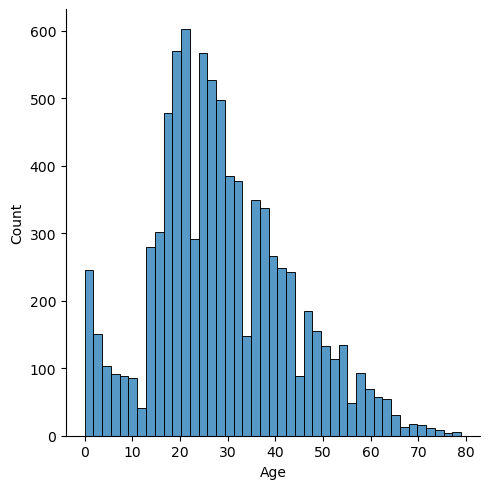

In [58]:
sns.displot(df_cons['Age']);

In [59]:
df_cons['Age'] = df_cons['Age'].fillna(df_cons['Age'].mean())
df_expl['Age'] = df_expl['Age'].fillna(df_expl['Age'].mean())

In [60]:
df_cons.isna().sum()

PassengerId       0
HomePlanet        0
CryoSleep       217
Destination     182
Age               0
VIP               0
RoomService       0
FoodCourt         0
ShoppingMall      0
Spa               0
VRDeck            0
Name            200
Transported       0
Cabin_Letter    199
Cabin_Number    199
Cabin_Side      199
Last_Name       200
Expense           0
ExpenseYes        0
Expense_cat       0
dtype: int64

Como en las columnas de gasto, ahora categorizaremos `Age`, ya que no hay valores faltantes:

In [61]:
df_total.Age.max()

79.0

In [62]:
#Primero aplicamos en el dataset de construcción

# Definimos los límites y etiquetas para los intervalos
bins = [0, 10, 20, 30, 40, 50, 60, 70, float('inf')]
labels = ['Menor de 10 años', 'Entre 10 y 19 años', 'Entre 20 y 29 años', 'Entre 30 y 39 años', 
          'Entre 40 y 49 años', 'Entre 50 y 59 años', 'Entre 60 y 69 años', 'Entre 70 y 79 años']

# Categorizamos la variable 'Age' en los intervalos definidos
df_cons['Age_cat'] = pd.cut(x = df_cons['Age'], 
                                 bins = bins, 
                                 labels = labels, 
                                 right = False)

#Y luego en el de explotación

# Definimos los límites y etiquetas para los intervalos

# Categorizamos la variable 'Age' en los intervalos definidos
df_expl['Age_cat'] = pd.cut(x = df_expl['Age'], 
                                 bins = bins, 
                                 labels = labels, 
                                 right = False)

##### Columna `Cryosleep`

Rellenaremos los datos faltantes de la columna `Cryosleep` con la siguiente política:
- Si ha gastado, no ha podido estar en criosueño, por tanto rellenaremos con `Cryosleep = False`.
- Si no ha gastado...
    - Y es mayor de edad, rellenaremos con `Cryosleep = True`, ya que un adulto lo más probable es que si no está en criosueño debe de gastar algo en comida durante el viaje.
    - Y es menor de edad, rellenaremos con `Cryosleep = False`, ya que siendo menor de edad, lo más probable es que los adultos que estén a cargo suyo/a se paguen por ese pasajero menor de edad.

In [63]:
def impute_cryosleep(df):
    for index, row in df.iterrows():
        if pd.isna(row['CryoSleep']):
            if pd.notna(row['Expense']):
                df.loc[index, 'CryoSleep'] = False
            elif pd.notna(row['Age']) and row['Age'] >= 18:
                df.loc[index, 'CryoSleep'] = True
            else:
                df.loc[index, 'CryoSleep'] = False


In [64]:
impute_cryosleep(df_cons)
impute_cryosleep(df_expl)

##### Variable Cabin

Imputaremos las variables derivadas de `Cabin` (`Cabin_Letter`, `Cabin_Number` y `Cabin_Side`) por el valor inmediatamente posterior. Ya que el dataframe está indexado según el `Passenger Id`, entendemos que las personas viajarán juntas

In [65]:
#Rellenamos la columna 'Cabin_Letter'
df_cons['Cabin_Letter'] = df_cons['Cabin_Letter'].fillna(method = 'ffill')
df_expl['Cabin_Letter'] = df_expl['Cabin_Letter'].fillna(method = 'ffill')

#Rellenamos la columna 'Cabin_Number'
df_cons['Cabin_Number'] = df_cons['Cabin_Number'].fillna(method = 'ffill')
df_expl['Cabin_Number'] = df_expl['Cabin_Number'].fillna(method = 'ffill')

#Rellenamos la columna 'Cabin_Side'
df_cons['Cabin_Side'] = df_cons['Cabin_Side'].fillna(method = 'ffill')
df_expl['Cabin_Side'] = df_expl['Cabin_Side'].fillna(method = 'ffill')

##### Variable Destination

Después de investigar sobre posibles correlaciones de `Destination` con otras variables no encontramos correlación alguna. Por tanto, decidimos realizar una imputación basada en las proporciones de cada valor de la variable, de tal manera que la imputación no terjiverse dicha proporción. 

/Users/alex/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


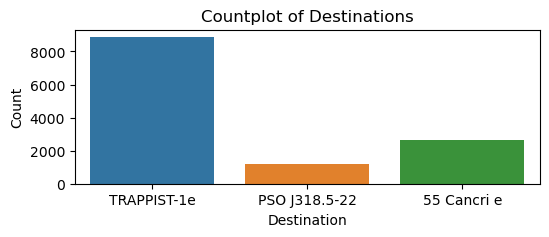

In [66]:
plt.figure(figsize = (6, 2))
sns.countplot(df_total['Destination'])

plt.title('Countplot of Destinations')
plt.xlabel('Destination')
plt.ylabel('Count')

plt.show()

In [77]:
def impute_destination(df):
    '''
    Función para imputar los valores faltantes en 'Destination' basados en las proporciones del DataFrame
    
    Args:
    df: un DataFrame de pandas
    
    '''
    proportions = df['Destination'].value_counts(normalize=True) # Calculamos las proporciones de cada destinación
    
    # Reemplazamos los valores faltantes en 'Destination' utilizando las proporciones
    df['Destination'] = df['Destination'].fillna(pd.Series(np.random.choice(proportions.index, p=proportions.values, size=len(df))))
    
    return df

In [78]:
impute_destination(df_cons)
impute_destination(df_expl)

df_cons.isna().sum()

PassengerId       0
HomePlanet        0
CryoSleep         0
Destination       0
Age               0
VIP               0
RoomService       0
FoodCourt         0
ShoppingMall      0
Spa               0
VRDeck            0
Name            200
Transported       0
Cabin_Letter      0
Cabin_Number      0
Cabin_Side        0
Last_Name       200
Expense           0
ExpenseYes        0
Expense_cat       0
Age_cat           0
dtype: int64

Ya lo tenemos. Tenemos todos los valores faltantes rellenos. En un primer momento pensamos en eliminar ya las variables numéricas que no nos interesan, pero lo haremos después del análisis de datos atípicos. Las variables a eliminar serán:
- `Last_Name` y `Name`.
- `Age`.
- `Expense`.
- `RoomService`, `FoodCourt`, `ShoppingMall`, `Spa` y `VRDeck`.

In [79]:
cols_to_remove = ['Age', 'Last_Name', 'Name', 'Expense', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']

#df_cons.drop(cols_to_remove, axis = 1, inplace = True)
#df_expl.drop(cols_to_remove, axis = 1, inplace = True)

Comprobamos finalmente los valores faltantes:

In [80]:
print(df_cons.isna().sum())
print('\n----------------\n')


PassengerId       0
HomePlanet        0
CryoSleep         0
Destination       0
Age               0
VIP               0
RoomService       0
FoodCourt         0
ShoppingMall      0
Spa               0
VRDeck            0
Name            200
Transported       0
Cabin_Letter      0
Cabin_Number      0
Cabin_Side        0
Last_Name       200
Expense           0
ExpenseYes        0
Expense_cat       0
Age_cat           0
dtype: int64

----------------

PassengerId      0
HomePlanet       0
CryoSleep        0
Destination      0
Age              0
VIP              0
RoomService      0
FoodCourt        0
ShoppingMall     0
Spa              0
VRDeck           0
Name            94
Cabin_Letter     0
Cabin_Number     0
Cabin_Side       0
Last_Name       94
Expense          0
ExpenseYes       0
Expense_cat      0
Age_cat          0
dtype: int64


#### b.3) Análisis de outliers

Vamos a realizar el análisis de outliers de las variables numéricas:


In [81]:
cols_num = ['Age', 'Expense', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']

##### b.3.1) Boxplot de distribuciones

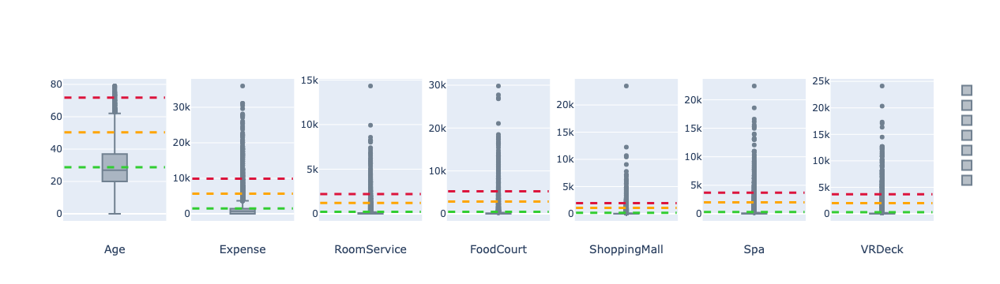

In [82]:
# Crea una serie de plots con 1 row y tantas columnas como tenga el listado
fig = make_subplots(1, len(cols_num))

# Crea un plot por columna y el título debajo por columna
for i, column in enumerate(cols_num):

    # Box plot
    fig.add_trace(
        go.Box(y=df_cons[column], name=' ', marker=dict(color='SlateGray')),
        row=1, col=i+1,) # Position: Row 1, columna según iteración
    fig.update_xaxes(title_text=column, col=i+1) # Agrega un título en el eje x
    
    # Línea de media
    mean = df_cons[column].mean()
    fig.add_shape(
        type='line',
        x0=-1, x1=1, # Width: De izquierda a derecha
        y0=mean, y1=mean, # Height: Media
        line=dict(color='LimeGreen', width=3, dash='dash'), # Styles
        row=1, col=i+1 # Position: Plot iterado
    )

    # Línea de atípicos leves
    low_outliers = mean + 1.5 * df_cons[column].std()
    fig.add_shape(
        type='line',
        x0=-1, x1=1, # Width: De izquierda a derecha
        y0=low_outliers, y1=low_outliers, # Height: Atipicos leves
        line=dict(color='Orange', width=3, dash='dash'), # Styles
        row=1, col=i+1 # Position: Plot iterado
    )
     
    # Línea de atípicos graves
    high_outliers = mean + 3 * df_cons[column].std()
    fig.add_shape(
        type='line',
        x0=-1, x1=1, # Width: De izquierda a derecha
        y0=high_outliers, y1=high_outliers, # Height: Atipicos leves
        line=dict(color='Crimson', width=3, dash='dash'), # Styles
        row=1, col=i+1 # Position: Plot iterado
    )
fig.show()

Dado lo observado, consideramos la variable `Age` sin outliers y vamos a proceder a analizar en mayor detalle las otras variables, por lo que eliminaremos `Age` del listado de variables de estudio.

In [83]:
df_total.Age.max()

79.0

In [84]:
cols_outliers = cols_num.copy()
cols_outliers.remove('Age')

Creamos una función para visualizar en un `scatter` los datos de `gasto` frente a la variable `Age`, para entender que pasajeros gastan más y gastan menos y ver si hay algunos datos atípicos:

In [85]:
def show_scatter_plot(df, x_value, y_values, title=""):
    """
    Muestra un scatter plot por cada valor de x enviado frente a y.

    Args:
        df (DataFrame): Un DataFrame de Pandas.
        x_value (str): El nombre de una columna en el DataFrame para el eje X.
        y_values (list): Listado de columnas de un DF para usar en el eje Y.
        title (str): El nombre para el subplot general.

    Returns:
        None
    """
    # Calcula el número de filas y columnas para la cuadrícula de gráficos
    num_rows = 2
    num_cols = 3
    
    # Crea un panel para contener varios plots con la cantidad de filas y columnas definidas
    fig = make_subplots(rows=num_rows, cols=num_cols)

    # Crea un plot por cada columna en y_values
    for i, column in enumerate(y_values):
        # Calcula la posición del plot en la cuadrícula
        row = (i // num_cols) + 1
        col = (i % num_cols) + 1
        
        fig.add_trace(
            go.Scatter(
                x=df[x_value], y=df[column],
                mode='markers'
            ),
            row=row, col=col
        )
        
        fig.update_xaxes(title_text=x_value, row=row, col=col)
        fig.update_yaxes(title_text=column, row=row, col=col)
        
    fig.update_layout(width=1200, height=700, showlegend=False, title_text=title)
    fig.show()

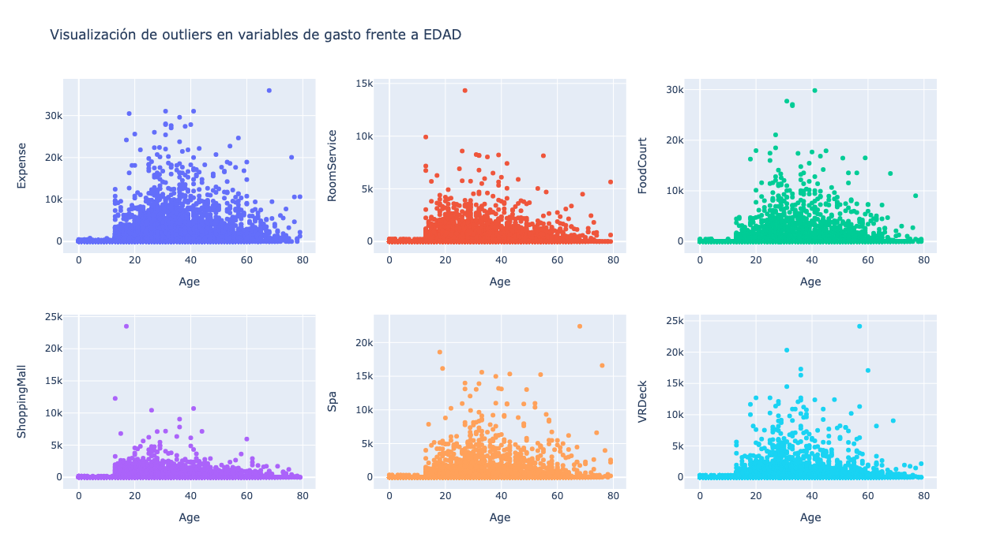

In [86]:
show_scatter_plot(df_cons, 'Age', cols_outliers, title = 'Visualización de outliers en variables de gasto frente a EDAD')

Según el análisis convencional de outliers deberiamos considerar datos atípicos leves aquellos que se desvien + - 1.5 veces la `desviación típica`, y atípicos graves aquellos que lo hagan 3 veces. Sin embargo, si tiene sentido que un pasajero de 70 años gaste mucho más dinero que los demás en alguna dependencia. 

Lo que no tiene sentido es que __haya menores de 10 años, incluso de 5 o 3, que realicen gastos__. Investigamos aquellos pasajeros que hayan gastado algo y que tengan menos de 10 y 5 años:

In [87]:
df_cons[(df_cons['ExpenseYes'] == True) & (df_cons['Age'] < 5)].shape

(54, 21)

54 niños de menos de 5 años han registrado gastos.

In [88]:
df_cons[(df_cons['ExpenseYes'] == True) & (df_cons['Age'] < 10)].shape

(75, 21)

75 niños de menos de 10 años han registrado gastos. Visualicémoslos algunos ejemplos:

In [89]:
(
df_cons[(df_cons['ExpenseYes'] == True) & (df_cons['Age'] < 10)]
    [['PassengerId', 'Age', 'Expense', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']][:10] #solo 10 ejemplos
)

,PassengerId,Age,Expense,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
25,0020_05,1.0,224.687617,224.687617,0.000000,0.000000,0.000000,0.000000
86,0092_02,0.0,173.729169,0.000000,0.000000,173.729169,0.000000,0.000000
574,0599_02,4.0,458.077203,0.000000,458.077203,0.000000,0.000000,0.000000
748,0787_01,7.0,304.854791,0.000000,0.000000,0.000000,0.000000,304.854791
1034,1100_02,5.0,224.687617,224.687617,0.000000,0.000000,0.000000,0.000000
1147,1211_07,1.0,311.138778,0.000000,0.000000,0.000000,311.138778,0.000000
1207,1287_02,4.0,311.138778,0.000000,0.000000,0.000000,311.138778,0.000000
1210,1289_01,8.0,304.854791,0.000000,0.000000,0.000000,0.000000,304.854791
1311,1390_01,1.0,173.729169,0.000000,0.000000,173.729169,0.000000,0.000000
1493,1584_02,0.0,224.687617,224.687617,0.000000,0.000000,0.000000,0.000000


Como vemos, no tiene sentido que el pasajero `0020_05` que tiene __1 año__ gaste 224.7 en `RoomService`. Por tanto, decidimos imputar a __0 gasto__ todos los registros de las variables de gasto de aquellos pasajeros menores de 10 años. Para ello crearemos una función que impute esos valores.

#### b.4) Tratamiento de outliers

In [90]:
def outliers_expense(df, limit_age):
    '''
    Función para imputar a 0 los valores atípicos en la columna 'Expense' de aquellos pasajeros menos de una edad límite.
    
    Args:
        df: un DataFrame de pandas
        limit_age: la edad límite que consideremos para realizar gasto
    
    '''
    df.loc[df['Age'] < limit_age, ['Expense', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']] = 0
    df.loc[df['Age'] < limit_age, 'ExpenseYes'] = False
    
    return df

Aplicamos la función y consideramos 10 años como el límite para que no realicen gastos.

In [91]:
outliers_expense(df_cons, 10)
outliers_expense(df_expl, 10)

df_cons[(df_cons['ExpenseYes'] == True) & (df_cons['Age'] < 10)]

,PassengerId,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported,Cabin_Letter,Cabin_Number,Cabin_Side,Last_Name,Expense,ExpenseYes,Expense_cat,Age_cat


In [92]:
cols_to_remove = ['Age', 'Last_Name', 'Name', 'Expense', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']

df_cons.drop(cols_to_remove, axis = 1, inplace = True)
df_expl.drop(cols_to_remove, axis = 1, inplace = True)

### c) [FEATURE SELECTION] Detección de las variables más importantes con respecto a la variable objetivo (Transported)

Ahora que los datos faltantes y atípicos están tratos, vemos como se nos ha quedado el dataset. Vemos que hay muchas variables de tipo `object`, por lo que para proceder a realizar las matrices de correlaciones y la selección de variables más importantes que se nos pide en este apartado, las casteamos a `bool`.

In [93]:
df_cons.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8693 entries, 0 to 8692
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   PassengerId   8693 non-null   object  
 1   HomePlanet    8693 non-null   object  
 2   CryoSleep     8693 non-null   object  
 3   Destination   8693 non-null   object  
 4   VIP           8693 non-null   object  
 5   Transported   8693 non-null   object  
 6   Cabin_Letter  8693 non-null   object  
 7   Cabin_Number  8693 non-null   category
 8   Cabin_Side    8693 non-null   object  
 9   ExpenseYes    8693 non-null   object  
 10  Expense_cat   8693 non-null   object  
 11  Age_cat       8693 non-null   category
dtypes: category(2), object(10)
memory usage: 1022.6+ KB


In [94]:
#Primero en el dataset de construcción
df_cons['CryoSleep'] = df_cons['CryoSleep'].astype(bool)
df_cons['VIP'] = df_cons['VIP'].astype(bool)
df_cons['Transported'] = df_cons['Transported'].astype(bool)
df_cons['ExpenseYes'] = df_cons['ExpenseYes'].astype(bool)

#Y después en el dataset de explotación (no tiene transported)
df_expl['CryoSleep'] = df_expl['CryoSleep'].astype(bool)
df_expl['VIP'] = df_expl['VIP'].astype(bool)
df_expl['ExpenseYes'] = df_expl['ExpenseYes'].astype(bool)

Para proceder a la selección de variables y pintar una matriz de correlaciones de todo el dataset, tenemos que codificar nuestras variables. Lo hacemos utilizando la técnica `One-Hot Encoding`.

In [95]:
#Definimos una variable 'PassengerId' para sacar la columna passengerid y luego meterla de nuevo al DF.
passenger_id = df_cons['PassengerId']

# Codificamos las variables con Get Dummies
df_cons = pd.get_dummies(df_cons.drop('PassengerId', axis = 1), drop_first = True)

#Insertamos la columna 'passengerid' en la primera posición
df_cons.insert(0, 'PassengerId', passenger_id)

# Renombramos algunas columnas para que se identifiquen más claramente
df_cons.rename(columns={'VIP_True': 'VIP', 
                                 'CryoSleep_True': 'CryoSleep'}, inplace=True)

# Convertimos la variable 'transported' de booleano a entero (solo está en el conjunto de entrenamiento)
df_cons['Transported'] = df_cons['Transported'].astype(int)

Seguidamente, codificamos el conjunto de test:

In [96]:
#Definimos una variable 'passengerid' para sacar la columna passengerid y luego meterla de nuevo al DF.
passenger_id = df_expl['PassengerId']

# Codificamos las variables con Get Dummies
df_expl = pd.get_dummies(df_expl.drop('PassengerId', axis = 1), drop_first = True)

#Insertamos la columna 'passengerid' en la primera posición
df_expl.insert(0, 'PassengerId', passenger_id)

# Renombramos algunas columnas para que se identifiquen más claramente
df_cons.rename(columns={'VIP_True': 'VIP', 
                                 'CryoSleep_True': 'CryoSleep'}, inplace=True)

#### c.1) Matriz de correlaciones

In [97]:
df_cons.set_index('PassengerId', inplace=True)
df_expl.set_index('PassengerId', inplace=True)

In [98]:
matrix_corr = df_cons.corr().round(1)

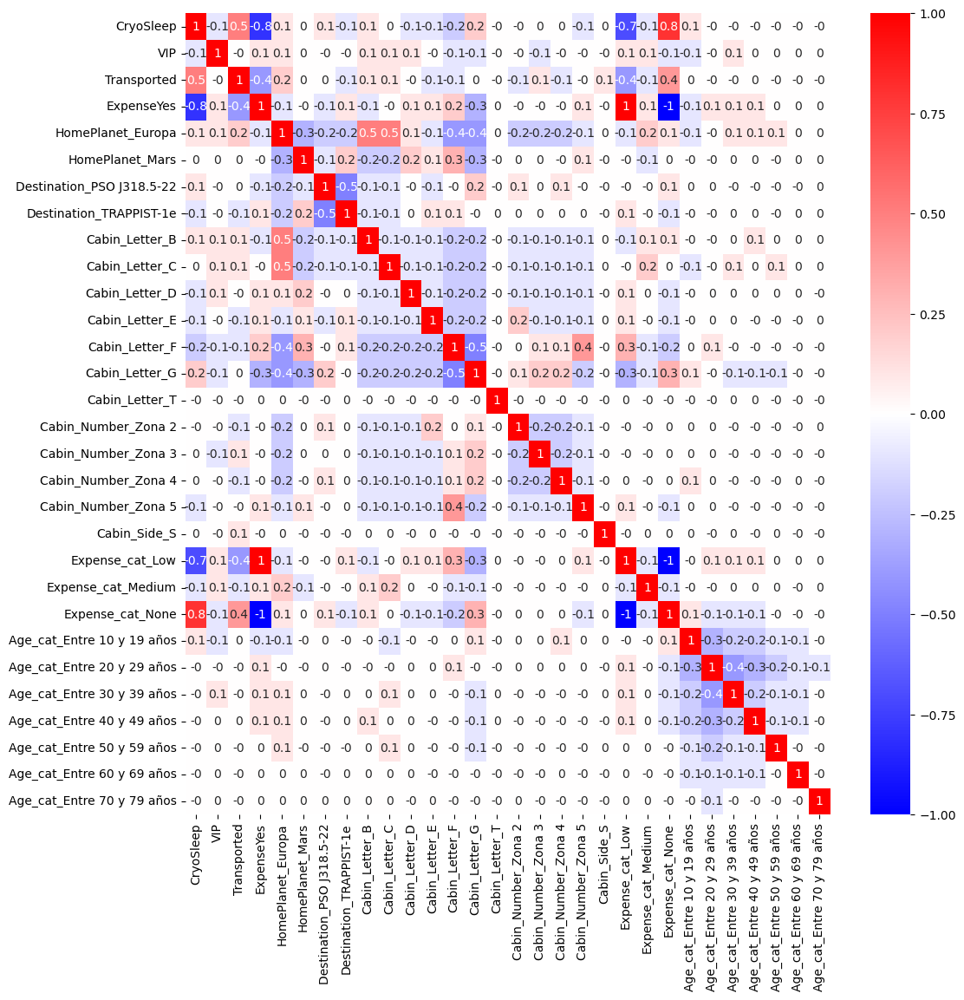

In [99]:
fig, ax = plt.subplots(figsize=(12, 12))

sns.heatmap(matrix_corr, annot = True, cmap = "bwr", vmax = 1, vmin = -1);

In [100]:
# Se hace un ranking de variables más correlacionadas con el target
matrix_corr['Transported'].abs().sort_values()[::-1]

Transported                   1.0
CryoSleep                     0.5
ExpenseYes                    0.4
Expense_cat_None              0.4
Expense_cat_Low               0.4
HomePlanet_Europa             0.2
Expense_cat_Medium            0.1
Cabin_Letter_C                0.1
Cabin_Side_S                  0.1
Cabin_Number_Zona 4           0.1
Cabin_Number_Zona 3           0.1
Cabin_Number_Zona 2           0.1
Destination_TRAPPIST-1e       0.1
Cabin_Letter_B                0.1
Cabin_Letter_F                0.1
Cabin_Letter_E                0.1
HomePlanet_Mars               0.0
VIP                           0.0
Destination_PSO J318.5-22     0.0
Age_cat_Entre 70 y 79 años    0.0
Cabin_Letter_D                0.0
Cabin_Letter_G                0.0
Age_cat_Entre 60 y 69 años    0.0
Cabin_Number_Zona 5           0.0
Age_cat_Entre 10 y 19 años    0.0
Age_cat_Entre 20 y 29 años    0.0
Age_cat_Entre 30 y 39 años    0.0
Age_cat_Entre 40 y 49 años    0.0
Age_cat_Entre 50 y 59 años    0.0
Cabin_Letter_T

Repetimos la correlación, pero esta vez de una forma más visual, centrándonos en la variable a predecir `Transported`:

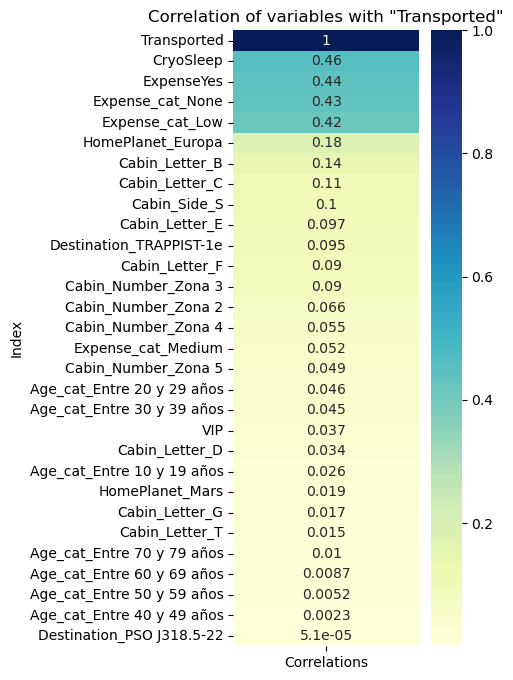

In [101]:
corr = df_cons.corrwith(df_cons['Transported']).abs().reset_index()
corr.columns = ['Index', 'Correlations']
corr = corr.set_index('Index')
corr = corr.sort_values(by = ['Correlations'], ascending = False)

plt.figure(figsize = (3, 8))

fig = sns.heatmap(corr, annot = True, fmt = '.2g', cmap = 'YlGnBu')

                     #fmt = '.2g' (String formatting code to use when adding annotations.)

plt.title('Correlation of variables with "Transported"')
plt.show()

Observamos que las variables que más relación guardan con `Transported` son `CryoSleep`y haber gastado dinero, aunque está última es redudante ya que si no estaba en criosueño, el pasajero habrá gastado dinero.

#### c.2) Selección de variables

El objetivo de este apartado será seleccionar las mejores características que nos permitan mejorar el rendimiento de la predicción de nuestro modelo. Mejores características haran un mejor modelo.

El resultado de la selección de características será un __subconjunto__ con las características más relevantes frente a la variable `Transported`.

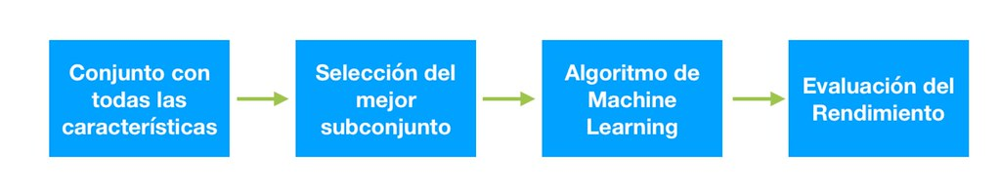

Probaremos varios métodos para la selección de variables (_Feature Engineering_). 

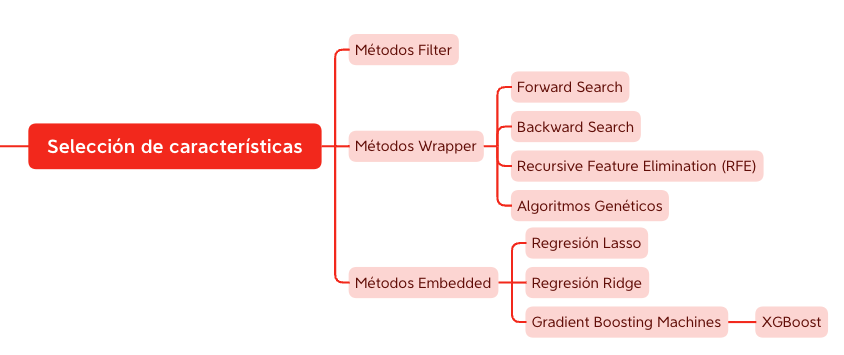

- De los __métodos Filter__ utilizaremos el `Test Chi_cuadrado` al tratarse de varaibles predictoras __categóricas__ y __target categórica__.
- De los __métodos Wrapper__ utilizaremos el método `Forward Search` y el `Recursive Feature Elimination (RFE)`.
- De los __métodos Embedded__ utilizaremos el método `XGBoost`, perteneciente al subtipo de los `Gradient Boosting Machines`.


##### c.2.1) División el conjunto de entrenamiento y conjunto de test

Necesitamos dividir nuestro dataset de construcción en 'train' y 'test', ya que habrá que entrar algunos modelos que utilizaremos para seleccionar las mejores variables y reducir la dimensionalidad del dataset. Cogeremos un 20% de los datos para construir el dataset de test.

In [102]:
# Definimos las varaibles predictoras
X = df_cons.drop('Transported', axis = 1)

# Definimos la variable a predecir
y = df_cons['Transported']

# Dividimos en train y test con la función train_test_split de sklearn
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print('División en conjunto de entrenamiento y test')
print(f'X_train: {X_train.shape}')
print(f'X_test: {X_test.shape}')
print(f'y_train: {y_train.shape}')
print(f'y_test: {y_test.shape}')

División en conjunto de entrenamiento y test
X_train: (6954, 29)
X_test: (1739, 29)
y_train: (6954,)
y_test: (1739,)


##### c.2.2) Escalar las variables

Antes de aplicar _Feature Engineering_ debemos escalar las variables:

In [103]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X_train)

X_train_sc = scaler.transform(X_train)
X_test_sc = scaler.transform(X_test)

##### c.2.3) Método Filter: Test Chi-Cuadrado (categóricas)

La __aproximación Filter__ implica evaluar a cada variable individualmente, utilizando alguna métrica o prueba estadística, y posteriormente clasificar las variables según esa métrica antes de construir el modelo. Una de las métricas que se pueden utilizar es el `Test Chi-Cuadrado`. Utilizaremos esta métrica porque la variable a predecir es categórica (`Transported`) y tenemos un conjunto de variables categóricas, tal y como se ve en la imagen a continuación.

El `test chi-cuadrado` es una prueba estadística que se utiliza para evaluar la independencia entre dos variables categóricas. El resultado del test chi-cuadrado es un estadístico __chi-cuadrado__ y __un p-valor__. Las variables con __p-valores__ bajos (significativos) se consideran más relevantes y pueden seleccionarse para su inclusión en el modelo.

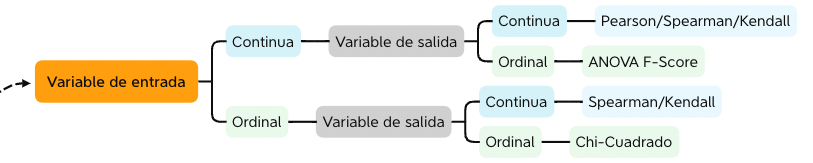

Creamos una función que nos imprima el resultado de aplicar el Test Chi-Cuadrado:

In [104]:
def test_chi(df):
    
    cols_pass = [] #columnas que pasarán el test
    cols_not_pass = [] #columnas que no pasarán el test
    
    for col in df.columns:
        if col == 'PassengerId':
            continue  # Saltamos la columna 'PassengerId'
        
        if col == 'Transported' and 'Transported' in df.columns:
            continue  # Saltamos la columna 'Transported' si existe
        
        # Convertimos las variables predictoras en enteros no negativos (si no lo están)
        df[col] = df[col].astype('int')
        
        # Aseguramos que la variable objetivo es binaria o entero no negativo (si no lo está)
        df['Transported'] = df['Transported'].astype('int')
        
        chi2_stat, p_values = chi2(df[[col]], df['Transported'])
        
        #Aquí, si el p-valor es menor a 0.05, añadimos la variable a la lista de varaibles que pasan el test
        
        if p_values[0] < 0.05:  # Ajustamos un 5% como nivel de significancia
            cols_pass.append(col)
        else:
            cols_not_pass.append(col)
        
        print(f'Variable: {col}')
        print(f'Chi-Square value: {chi2_stat[0].round(2)}')
        print(f'p-value: {p_values[0].round(6)}')
        print('---------------------------')
    
    #Después del bucle imprimiendo el resultado de cada variable, imprimimos la lista de variables que pasan el test y las que no
    print('\n')
    print('Features that pass the tests:')
    print(f'Best features: ({len(cols_pass)} features)', cols_pass)
    print('\n')
    print('Features that do not pass the tests:')
    print(f'Categorical features ({len(cols_not_pass)} features): ', cols_not_pass) 

In [105]:
test_chi(df_cons)

Variable: CryoSleep
Chi-Square value: 1197.5
p-value: 0.0
---------------------------
Variable: VIP
Chi-Square value: 11.79
p-value: 0.000595
---------------------------
Variable: ExpenseYes
Chi-Square value: 641.34
p-value: 0.0
---------------------------
Variable: HomePlanet_Europa
Chi-Square value: 211.01
p-value: 0.0
---------------------------
Variable: HomePlanet_Mars
Chi-Square value: 2.47
p-value: 0.115679
---------------------------
Variable: Destination_PSO J318.5-22
Chi-Square value: 0.0
p-value: 0.996362
---------------------------
Variable: Destination_TRAPPIST-1e
Chi-Square value: 23.99
p-value: 1e-06
---------------------------
Variable: Cabin_Letter_B
Chi-Square value: 164.27
p-value: 0.0
---------------------------
Variable: Cabin_Letter_C
Chi-Square value: 91.55
p-value: 0.0
---------------------------
Variable: Cabin_Letter_D
Chi-Square value: 9.68
p-value: 0.001863
---------------------------
Variable: Cabin_Letter_E
Chi-Square value: 72.78
p-value: 0.0
------------

Un `p-valor` bajo sugiere que las diferencias observadas entre las frecuencias observadas y las frecuencias esperadas en la tabla de contingencia son estadísticamente significativas, lo que implica que la variable categórica puede ser relevante para predecir la variable objetivo.

##### c.2.4) Métodos Wrapper: Forward Search

En este primer tipo de búsqueda se van seleccionando conjuntos de variables de cada vez mayor tamaño. Escogeremos siempre los que mejor rendimiento den desde el punto de vista de una métrica de calidad (en este caso, el *accuracy*).

Cuanto mayor sea `n_estimators` mejor se supone que será nuestro modelo, por la cantidad de conjuntos con los que entrena. No obstante, también aumentará la complejidad del modelo. Debemos encontrar el equilibrio

In [106]:
from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.ensemble import RandomForestClassifier


feature_selector = SequentialFeatureSelector(RandomForestClassifier(n_estimators=10), 
                                             k_features = 10, 
                                             forward = True,
                                             verbose = 2, 
                                             scoring = 'accuracy', 
                                             cv = 10)

feature_selector = feature_selector.fit(X_train_sc, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    3.3s finished

[2023-09-04 20:04:49] Features: 1/10 -- score: 0.7172862399735385[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:    3.6s finished

[2023-09-04 20:04:53] Features: 2/10 -- score: 0.7362705697510956[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    3.5s finished

[2023-09-04 20:04:56] Features: 3/10 -- score: 0.7374206152319525[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

El mejor subconjunto sería con __10 variables__ según el método _Forward Search_, que es el máximo número de variables que hemos definido en el modelo. Imprimimos el mejor resultado de cada etapa:

In [107]:
feature_selector.subsets_

{1: {'feature_idx': (0,),
  'cv_scores': array([0.72126437, 0.7183908 , 0.69252874, 0.72844828, 0.70647482,
         0.71654676, 0.73093525, 0.70071942, 0.72230216, 0.7352518 ]),
  'avg_score': 0.7172862399735385,
  'feature_names': ('0',)},
 2: {'feature_idx': (0, 2),
  'cv_scores': array([0.73706897, 0.73132184, 0.70833333, 0.74281609, 0.73381295,
         0.73381295, 0.74388489, 0.72086331, 0.75539568, 0.75539568]),
  'avg_score': 0.7362705697510956,
  'feature_names': ('0', '2')},
 3: {'feature_idx': (0, 2, 10),
  'cv_scores': array([0.73994253, 0.7341954 , 0.7112069 , 0.74137931, 0.7323741 ,
         0.74100719, 0.74388489, 0.71942446, 0.75395683, 0.75683453]),
  'avg_score': 0.7374206152319525,
  'feature_names': ('0', '2', '10')},
 4: {'feature_idx': (0, 2, 4, 10),
  'cv_scores': array([0.73706897, 0.73563218, 0.71408046, 0.74425287, 0.73669065,
         0.74100719, 0.74676259, 0.72230216, 0.75827338, 0.75395683]),
  'avg_score': 0.7390027288514016,
  'feature_names': ('0', '2',

Veamos cuales han sido las __características seleccionadas__:

In [108]:
feature_selector.k_feature_names_

('0', '1', '2', '4', '5', '7', '8', '10', '14', '21')

Entrenaremos un modelo con las características seleccionadas y evaluaremos su rendimiento:

In [109]:
# Aplicamos la selección de características a los conjuntos de train y test
X_train_selected = feature_selector.transform(X_train_sc)
X_test_selected = feature_selector.transform(X_test_sc)

# Creamos un nuevo modelo de RandomForestClassifier
model = RandomForestClassifier(n_estimators=10)

# Entrenamos el modelo con las características seleccionadas
model.fit(X_train_selected, y_train)

from sklearn.metrics import accuracy_score

# Realizamos predicciones en el conjunto de test
y_pred = model.predict(X_test_selected)

# Calculamos la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión del modelo con características seleccionadas: {:.2f}%".format(accuracy * 100))

Precisión del modelo con características seleccionadas: 74.35%


Que es lo mismo que hacer... 

In [110]:
print("Precisión del modelo con características seleccionadas: {:.2f}%".format(feature_selector.k_score_ * 100))

Precisión del modelo con características seleccionadas: 74.13%


##### c.2.5) Métodos Wrapper: _Recursive Feature Elimination_ (RFE)

`Recursive Feature Elimination (RFE)` es otra técnica de selección de características que funciona eliminando iterativamente las características menos importantes según un modelo, nosotros eligiremos un `Random Forest Classifier`.

In [111]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFECV
from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score

# Creamos un Random Forest classifier
rf = RandomForestClassifier(n_estimators = 10, random_state = 42)

# Creamos la métrica de calidad Fisher Scorer
scorer = make_scorer(f1_score, average = 'weighted')

# Creamos el objeto RFE
rfecv = RFECV(estimator=rf, step = 1, cv = 5, scoring = scorer)

# Ajuste del RFECV al conjunto de entrenamiento
rfecv.fit(X_train_sc, y_train)

# Impresión del número óptimo de características
print("Optimal number of features: %d" % rfecv.n_features_)

Optimal number of features: 11


Visualizamos en una gráfica:

Text(0, 0.5, 'Cross validation score (nb of correct classifications)')

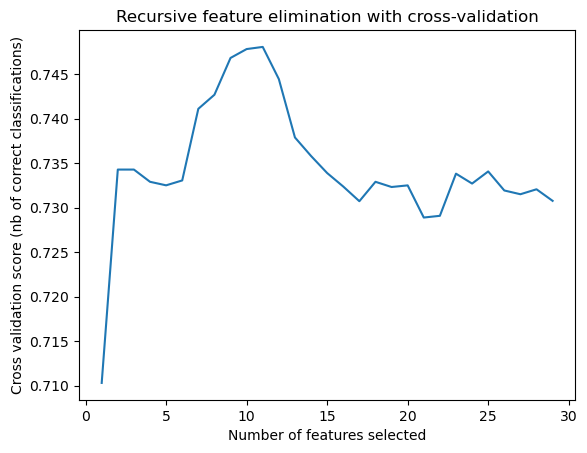

In [112]:
ax = sns.lineplot(x = np.arange(1, len(rfecv.cv_results_['mean_test_score'])+1),
                y = rfecv.cv_results_['mean_test_score'])

ax.set_title('Recursive feature elimination with cross-validation')
ax.set_xlabel('Number of features selected')
ax.set_ylabel('Cross validation score (nb of correct classifications)')

Imprimimos las características seleccionadas con el modelo `Recursive Feature Elimination`:

In [113]:
selected_features = X_train.columns[rfecv.support_]
print(selected_features)

Index(['CryoSleep', 'ExpenseYes', 'HomePlanet_Europa', 'HomePlanet_Mars',
       'Destination_TRAPPIST-1e', 'Cabin_Letter_F', 'Cabin_Letter_G',
       'Cabin_Number_Zona 3', 'Cabin_Side_S', 'Expense_cat_None',
       'Age_cat_Entre 30 y 39 años'],
      dtype='object')


##### c.2.6) Métodos Embedded: _Gradient Boosting Machines_ - __XG Boost__

Los métodos `Embedded` son técnicas de selección de características que combinan el proceso de construcción del modelo y la selección de variables en una __sola etapa__. Estos métodos utilizan algoritmos de aprendizaje automático para __ajustar el modelo mientras identifican automáticamente las características más relevantes__. Esto permite que el modelo optimice directamente la selección de características durante su entrenamiento, lo que puede conducir a un mejor rendimiento general y una mayor eficiencia computacional en comparación con métodos de selección de características por separado.

En concreto, `XGBoost` es un tipo de __Gradient Boosting__. Es una técnica de aprendizaje automático basada en árboles de decisión. En XGBoost, se utilizan múltiples árboles de decisión débiles, y estos se construyen de manera secuencial para mejorar el rendimiento del modelo. __Cada árbol se ajusta a los residuos del modelo anterior, lo que permite que el modelo aprenda de los errores cometidos__ en las etapas anteriores y se concentre en los patrones difíciles de capturar.



In [114]:
import xgboost as xgb
from sklearn import model_selection

#Creamos el objeto KFOLD para realizar una validación cruzada (la evaluación será más robusta)
kfold = model_selection.KFold(n_splits = 10) # 10 particiones

# Creamos el modelo de XgBoost
model_xgboost = xgb.XGBClassifier(n_estimators = 100, max_depth = 6)

# Entrenamos el modelo
model_xgboost.fit(X_train_sc, y_train)

# Evaluamos el modelo con la media de los resultados de la validación cruzada
results = model_selection.cross_val_score(estimator = model_xgboost, 
                                          X = X_train, 
                                          y = y_train, 
                                          cv = kfold)

print(f'Rendimiento del modelo: {results.mean().round(4) * 100} %')

Rendimiento del modelo: 74.39 %


Ahora, visualizaremos las mejores variables según el modelo `XG Boost`:

CryoSleep: 0.4433841407299042
Cabin_Letter_G: 0.08679468929767609
ExpenseYes: 0.06711262464523315
Cabin_Number_Zona 3: 0.04927917569875717
HomePlanet_Europa: 0.04751428961753845
Cabin_Letter_E: 0.042484890669584274
Cabin_Letter_C: 0.0308360755443573
Cabin_Letter_F: 0.023188237100839615
Cabin_Side_S: 0.019449971616268158
HomePlanet_Mars: 0.01769912615418434
Cabin_Number_Zona 5: 0.014489850960671902
Destination_TRAPPIST-1e: 0.011690864339470863
Cabin_Number_Zona 4: 0.01130583230406046
Age_cat_Entre 40 y 49 años: 0.011191568337380886
Expense_cat_Low: 0.011126560159027576
Cabin_Number_Zona 2: 0.010737455449998379
Age_cat_Entre 20 y 29 años: 0.010678263381123543
Cabin_Letter_B: 0.010572822764515877
Age_cat_Entre 10 y 19 años: 0.010490681044757366
Expense_cat_Medium: 0.01035680714994669
Age_cat_Entre 30 y 39 años: 0.009762161411345005
Destination_PSO J318.5-22: 0.009564169682562351
Expense_cat_None: 0.009029729291796684
Cabin_Letter_D: 0.007735848892480135
Age_cat_Entre 50 y 59 años: 0.00721

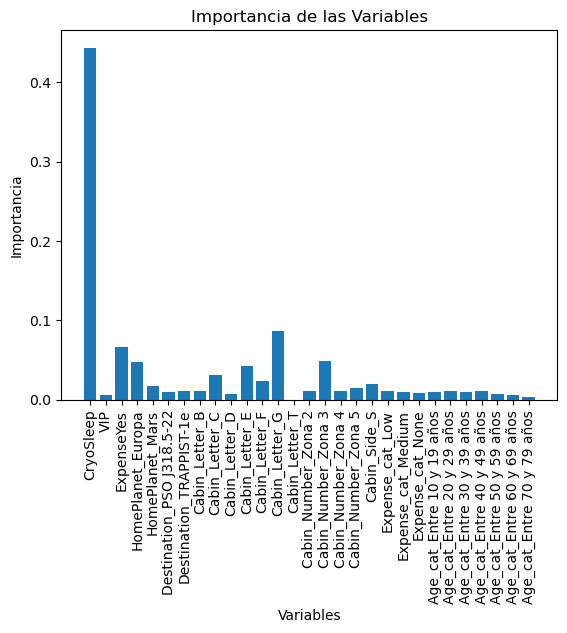

In [115]:
# Definimos las importancias de cada variable
importancias_variables = model_xgboost.feature_importances_

# Creamos una lista que contenga los nombres de las variables y sus importancias correspondientes
importancias_variables_lista = list(zip(X_train.columns, importancias_variables))

# Ordenamos las variables según sus importancias (en orden descendente)
importancias_variables_ordenadas = sorted(importancias_variables_lista, key = lambda x: x[1], reverse = True)

# Imprimimos la lista de variables y sus importancias
for variable, importancia in importancias_variables_ordenadas:
    print(f"{variable}: {importancia}")

# Visualizamos las importancias de las variables
plt.bar(range(len(importancias_variables)), importancias_variables, tick_label=X_train.columns)
plt.xticks(rotation=90)
plt.xlabel('Variables')
plt.ylabel('Importancia')
plt.title('Importancia de las Variables')
plt.show()

### d) [MODEL CONSTRUCTION] Aplicación de técnicas de ML para determinar qué pasajeros fueron transportados y cuales no.

Recopilemos lo que tenemos hasta ahora:
- Datasets `df_cons` y `df_expl` limpios y codificados.
- División en `X_train, X_test, y_train e y_test` hecha.
- Escalado de los conjuntos anteriores.
- Detección (que no selección) de las mejores variables.

Bien, vayamos con la predicción.

In [116]:
# Guarda el DataFrame en el archivo CSV
df_cons.to_csv('./datasets/spaceship_cons_clean.csv', index=False)
df_expl.to_csv('./datasets/spaceship_expl_clean.csv', index=False)

In [117]:
df_cons_clean = pd.read_csv('./datasets/spaceship_cons_clean.csv')
df_expl_clean = pd.read_csv('./datasets/spaceship_expl_clean.csv')

df_cons_clean.head()

,CryoSleep,VIP,Transported,ExpenseYes,HomePlanet_Europa,HomePlanet_Mars,Destination_PSO J318.5-22,Destination_TRAPPIST-1e,Cabin_Letter_B,Cabin_Letter_C,Cabin_Letter_D,Cabin_Letter_E,Cabin_Letter_F,Cabin_Letter_G,Cabin_Letter_T,Cabin_Number_Zona 2,Cabin_Number_Zona 3,Cabin_Number_Zona 4,Cabin_Number_Zona 5,Cabin_Side_S,Expense_cat_Low,Expense_cat_Medium,Expense_cat_None,Age_cat_Entre 10 y 19 años,Age_cat_Entre 20 y 29 años,Age_cat_Entre 30 y 39 años,Age_cat_Entre 40 y 49 años,Age_cat_Entre 50 y 59 años,Age_cat_Entre 60 y 69 años,Age_cat_Entre 70 y 79 años
0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
1,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0
2,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0
3,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0
4,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0


#### d.1) Definición de variables predictoras y variable objetivo

In [118]:
#Definimos variables predictoras (dataset de construcción)
X = df_cons_clean.drop('Transported', axis = 1)

#Definición de variable objetivo
y = df_cons_clean['Transported']

#### d.2) División en conjuntos de entrenamiento y test (sobre el dataset de construcción)

In [119]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print(f'X_train: {X_train.shape}')
print(f'X_test: {X_test.shape}')
print(f'y_train: {y_train.shape}')
print(f'y_test: {y_test.shape}')

X_train: (6954, 29)
X_test: (1739, 29)
y_train: (6954,)
y_test: (1739,)


#### d.3) Escalado de variables

En este caso, como tenemos un dataset con variables categóricas ya codificadas a HotEncoding, no tiene sentido hacer un escalado de variables. Las variables codificadas en hotencoding ya están en una escala común, 0 o 1, por lo que no será necesario aplicar este paso del proceso de Machine Learning.

#### d.4) Análisis de Componentes Principales (PCA)

Ya que tenemos un dataset con 29 variables predictoras, vamos a aplicar un análisis PCA. Lo cierto es que, aunque el `Análisis de Componentes Principales` se realice eminentemente en datasets con variables numéricas, ya que al indicar la varianza explicada acumulada de cada variable nos permite saber que variables numéricas tienen mayor importancia, también se puede aplicar también datasets con variables categóricas (codificadas). 

Al aplicar un `PCA sobre variables categóricas`, estas se combinarán entre si para formar nuevas variables latentes, independientes entre si, y que reducirán la dimensionalidad del conjunto de datos. Además, las variables latentes suelen ser más fáciles de interpretar que las variables originales. Esto se debe a que las variables latentes representan las combinaciones lineales de las variables originales. Las combinaciones lineales pueden ser más fáciles de entender que las variables originales, lo que puede facilitar la interpretación de los resultados de los modelos de aprendizaje automático.

In [120]:
from sklearn.decomposition import PCA

pca = PCA() #definimos el modelo

X_train_pca = pca.fit_transform(X_train) #entrenamos y transformamos para el conjunto de train
X_test_pca = pca.transform(X_test) #transformamos para el conjunto de test

X_train_pca.shape, X_test_pca.shape

((6954, 29), (1739, 29))

Generamos dos gráficas, una para el conjunto de entrenamiento y otra para el de test. Cada gráfica muestra las muestras en el espacio de las dos primeras componentes principales, con las nubes de puntos representadas en diferentes colores para indicar la clase a la que pertenecen las muestras.

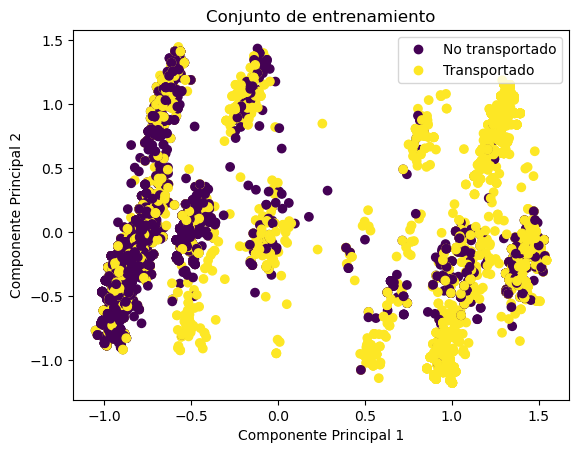

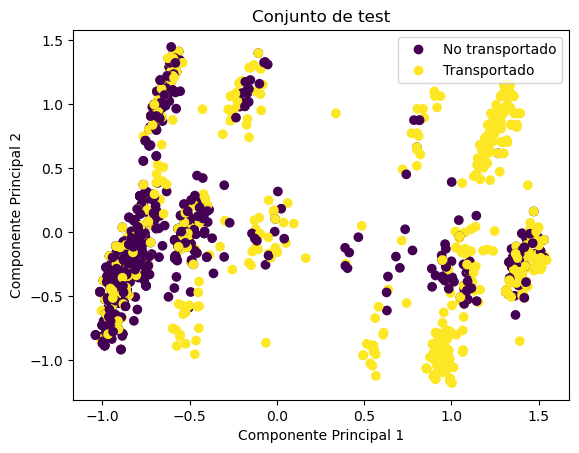

In [121]:
# Visualizamos el conjunto de entrenamiento
plot = plt.scatter(X_train_pca[:,0], X_train_pca[:,1], c = y_train)
plt.legend(handles = plot.legend_elements()[0], labels = ['No transportado', 'Transportado'])
plt.xlabel("Componente Principal 1") 
plt.ylabel("Componente Principal 2")
plt.title("Conjunto de entrenamiento")
plt.show()

# Visualizamos el conjunto de test
plot = plt.scatter(X_test_pca[:,0], X_test_pca[:,1], c = y_test)
plt.legend(handles = plot.legend_elements()[0], labels = ['No transportado', 'Transportado'])
plt.xlabel("Componente Principal 1") 
plt.ylabel("Componente Principal 2")
plt.title("Conjunto de test")
plt.show()

#### d.5 Modelos de predicción

Realizaremos las predicciones con los algorítmos más importantes en Aprendizaje Supervisado y analizaremos su `Accuracy`.

In [122]:
#Instanciación
log = LogisticRegression()
svm = SVC(probability=True)
nb = GaussianNB()
dt = DecisionTreeClassifier()
knn = KNeighborsClassifier(n_neighbors = 7)

#entrenamiento
log.fit(X_train, y_train)
svm.fit(X_train, y_train)
nb.fit(X_train, y_train)
dt.fit(X_train, y_train)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=7)

/Users/alex/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



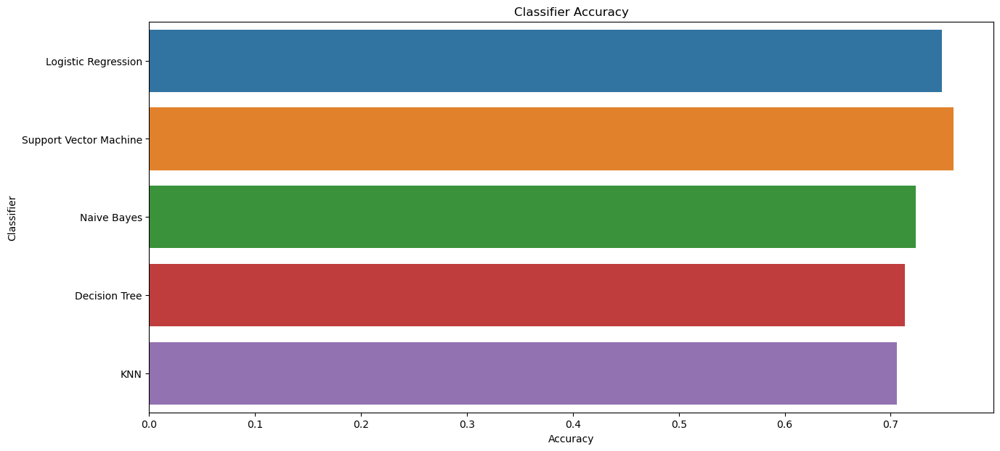

In [123]:
accuracyList = []
algorithm = []

#Calculamos Accuracy y lo almacenamos en lista para mostrar posteriormente
accuracyList.append(log.score(X_test, y_test))
accuracyList.append(svm.score(X_test, y_test))
accuracyList.append(nb.score(X_test, y_test))
accuracyList.append(dt.score(X_test, y_test))
accuracyList.append(knn.score(X_test, y_test))

#Añadimos los nombres de los algorítmos utilizados
algorithm.append("Logistic Regression")
algorithm.append("Support Vector Machine")
algorithm.append("Naive Bayes")
algorithm.append("Decision Tree")
algorithm.append("KNN")

#Visualización gráficas
f,ax = plt.subplots(figsize = (15,7))
sns.barplot(x = accuracyList, y = algorithm)
plt.xlabel("Accuracy")
plt.ylabel("Classifier")
plt.title('Classifier Accuracy')
plt.show()

Vamos ahora a predecir sobre el conjunto de test y calcular la matriz de confusión, parece que los mejores algorítmos de __Aprendizaje Supervisado serán__ `Support Vector Machines` y `Regresión Logística`.

In [124]:
accuracyList[1] #accuracy del algoritmo SVM

0.7590569292696953

In [125]:
#Lista donde se almacenarán las predicciones de cada algorítmo
predict_list = []

predictLR = log.predict(X_test)
predictSVM = svm.predict(X_test)
predictNB = nb.predict(X_test)
predictDT = dt.predict(X_test)
predictKNN = knn.predict(X_test)

/Users/alex/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



Imprimimos las métricas de calidad de la predicción de `Support Vector Machines`:

In [126]:
from sklearn.metrics import classification_report

print(classification_report(y_test, predictSVM))

              precision    recall  f1-score   support

           0       0.73      0.80      0.77       861
           1       0.79      0.72      0.75       878

    accuracy                           0.76      1739
   macro avg       0.76      0.76      0.76      1739
weighted avg       0.76      0.76      0.76      1739



Podemos concluir lo siguiente:
- __Precision__: 
    - De todos los pasajeros que el modelo predijo que no fueron transportados, el 73% realmente no fueron transportados.
    - De todos los pasajeros que el modelo predijo que fueron transportados, el 79% realmente fueron transportados.
- __Recall__:
    - Un 81% de los pasajeros que no fueron transportados fueron clasificados correctamente como NO transportados por el modelo.
    - Un 71% de los pasajeros que realmente fueron transportados fueron clasificados correctamente como transportados por el modelo.

__El modelo tiene una mayor capacidad para identificar correctamente a los pasajeros que no fueron transportados (81% de recall)__ que para identificar a los pasajeros que sí fueron transportados (71% de recall).

Construiremos las `matrices de confusión` para cada algorítmo y las visualizaremos:

In [127]:
from sklearn.metrics import confusion_matrix

cmLR = confusion_matrix(y_test, predictLR)
cmSVM = confusion_matrix(y_test, predictSVM)
cmNB = confusion_matrix(y_test, predictNB)
cmDT = confusion_matrix(y_test, predictDT)
cmKNN = confusion_matrix(y_test, predictKNN)

Text(0.5, 1.0, 'KNN')

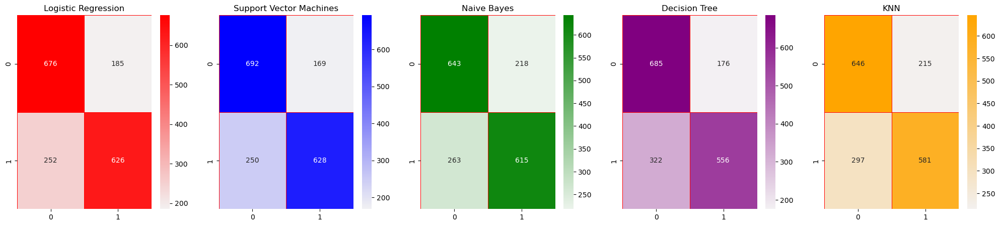

In [128]:
width = 25
height = 5

f, ax = plt.subplots(1, 5)
f.set_size_inches(width, height)

# Logistic Regression
cmap = sns.light_palette("red", as_cmap=True)
sns.heatmap(cmLR, annot = True,linewidths=0.5,
            linecolor = "red", fmt = ".0f",ax = ax[0], cmap=cmap)
ax[0].set_title('Logistic Regression')

# Support Vector Machines
cmap = sns.light_palette("blue", as_cmap=True)
sns.heatmap(cmSVM, annot = True,linewidths=0.5,
            linecolor = "red", fmt = ".0f",ax = ax[1], cmap=cmap)
ax[1].set_title('Support Vector Machines')

# Naive Bayes
cmap = sns.light_palette("green", as_cmap=True)
sns.heatmap(cmNB, annot = True,linewidths=0.5,
            linecolor = "red", fmt = ".0f",ax = ax[2], cmap=cmap)
ax[2].set_title('Naive Bayes')

# Decision Tree
cmap = sns.light_palette("purple", as_cmap=True)
sns.heatmap(cmDT, annot = True,linewidths=0.5,
            linecolor = "red", fmt = ".0f",ax = ax[3], cmap=cmap)
ax[3].set_title('Decision Tree')

# KNN
cmap = sns.light_palette("orange", as_cmap=True)
sns.heatmap(cmKNN, annot = True,linewidths=0.5,
            linecolor = "red", fmt = ".0f",ax = ax[4], cmap=cmap)
ax[4].set_title('KNN')


Visualizaremos la curva ROC y Precision-Recall para el mejor algorítmo (SVM):

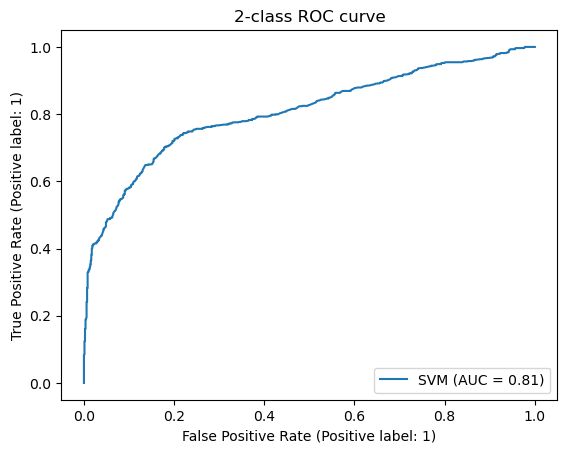

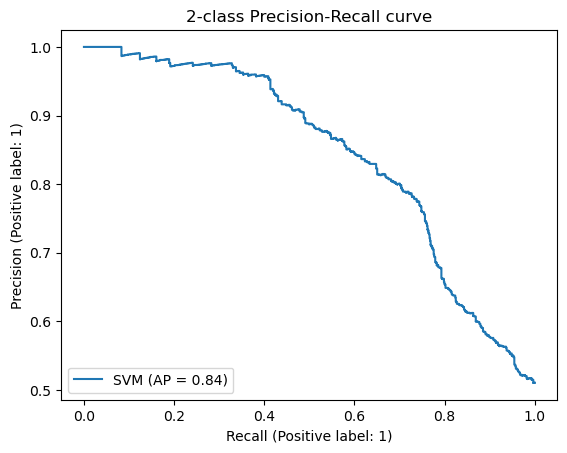

In [129]:
#Visualización de curva ROC y Precision-Recall
from sklearn.metrics     import RocCurveDisplay, PrecisionRecallDisplay
display = RocCurveDisplay.from_estimator(svm, X_test, y_test, name = 'SVM')
_ = display.ax_.set_title('2-class ROC curve')

display = PrecisionRecallDisplay.from_estimator(svm, X_test, y_test, name = 'SVM')
_ = display.ax_.set_title('2-class Precision-Recall curve')

Calcularemos la probabilidad de cada pasajero del dataset de `explotación` de ser transportado a la dimensión alternativa. El método `predict_proba()` devuelve las probabilidades estimadas de pertenecer a cada clase para cada registro de entrada. 

Como queremos quedarnos con la probabilidad de pertenecer a la `Clase 1 - Transportado` (que es la segunda columna del resultado de la predicción, la primera es probabilidad de pertenecer a `Clase 0 - no transportado`), utilizaremos `slicing`.

In [130]:
def predict_prob_transported_statistics(df, model, prob):
    '''
    Args:
        - df: un Dataframe
        - model:
            - log: Regresión Logística
            - svm: Support Vector Machines
            - nb: Naive-Bayes
            - dt: Árbol de Decisión
            - knn: K-Vecinos
        - prob: float igual o menor a 1 que indique la probabilidad con la que asegurar los pasajeros que han sido transportados
    '''

    if model.__class__.__name__ == 'svm':
        model.probability = True

    prob_transported = model.predict_proba(df)[:, 1]

    prob_predictions_df = pd.DataFrame({
        "PassengerId": IDs_df_expl,
        "Prob_Transported": prob_transported.round(2)
    })

    prob_predictions_df = prob_predictions_df.sort_values("Prob_Transported", ascending=False)

    total_passengers = df.shape[0]
    transported_passengers_number = prob_predictions_df[prob_predictions_df["Prob_Transported"] >= prob].shape[0]
    not_transported_passengers_number = total_passengers - transported_passengers_number

    transported_passengers_list = list(prob_predictions_df[prob_predictions_df["Prob_Transported"] >= prob]['PassengerId'])
    
    # Gráfica de barras para comparar pasajeros transportados vs no transportados
    labels = ['Transportados', 'No Transportados']
    counts = [transported_passengers_number, not_transported_passengers_number]
    plt.bar(labels, counts, color = ['blue', 'red'])
    plt.xlabel('Transportados vs No transportados')
    plt.ylabel('Número de pasajeros')
    plt.title('Pasajeros transportados vs No transportados')
    plt.show()
    
    print(f'Resultados de la predicción con algorítmo {model.__class__.__name__}')
    print('---------------------------')
    
    print(f'Con el {prob * 100:.0f} % de probabilidad, del total de {total_passengers} pasajeros, {transported_passengers_number} pasajeros han sido transportados y {not_transported_passengers_number} no.')
    
    return transported_passengers_list #cambiar si se quiere que se muestren todos o no

Aplicamos la función y almacenamos el resultado en la variable `transported_passengers`:

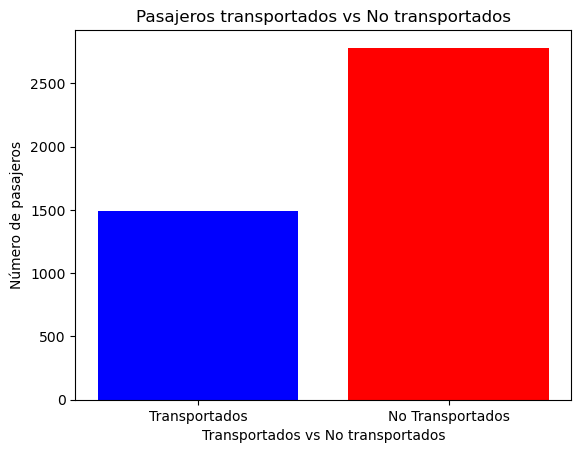

Resultados de la predicción con algorítmo SVC
---------------------------
Con el 75 % de probabilidad, del total de 4277 pasajeros, 1495 pasajeros han sido transportados y 2782 no.


In [131]:
transported_passengers = predict_prob_transported_statistics(df_expl_clean, svm, 0.75)

In [132]:
transported_passengers[:25]

['7893_05',
 '4551_04',
 '8576_01',
 '4740_01',
 '5164_01',
 '6516_01',
 '6210_01',
 '7426_02',
 '6710_01',
 '5228_02',
 '0775_03',
 '0775_02',
 '0775_01',
 '6575_01',
 '6516_02',
 '7893_03',
 '4639_02',
 '3876_01',
 '6819_03',
 '5382_01',
 '8875_01',
 '4971_01',
 '4639_01',
 '4626_01',
 '4551_03']

### e) [MODEL TUNING] Mejora los resultados optimizando los parámetros.

El objetivo del ajuste de hiperparámetros es encontrar la combinación óptima de valores para los parámetros del modelo que maximicen su rendimiento o precisión en los datos de entrenamiento y, al mismo tiempo, eviten el sobreajuste.

Seguiremos los siguientes pasos:

1. **Definimos las combinaciones de hiperparámetros:** Primero, definimos un conjunto de combinaciones de valores posibles para los hiperparámetros que deseamos ajustar en cada modelo. Por ejemplo, para el modelo de Regresión Logística, ajustamos los hiperparámetros relacionados con la regularización (C, penalty), mientras que para SVM, ajustamos el hiperparámetro C y el tipo de kernel.

2. **Realizamos el ajuste de hiperparámetros:** Utilizamos alguna técnica de ajuste de hiperparámetros, como búsqueda en cuadrícula (Grid Search) o búsqueda aleatoria (Random Search), para evaluar el rendimiento de cada modelo con diferentes combinaciones de hiperparámetros. Empleamos la validación cruzada durante el proceso de ajuste para tener una evaluación más robusta y evitar el sobreajuste.

3. **Evaluamos los resultados:** Después de ajustar los hiperparámetros, comparamos los resultados de rendimiento obtenidos para cada modelo con las diferentes combinaciones de hiperparámetros. Seleccionamos aquella combinación que proporciona el mejor rendimiento en los datos de validación.

4. **Reentrenamos y evaluamos:** Finalmente, reentrenamos el modelo seleccionado con la mejor combinación de hiperparámetros utilizando todo el conjunto de entrenamiento y evaluamos su rendimiento en el conjunto de prueba para obtener una medida final del rendimiento del modelo.

Una vez que hemos reentrenado ambos modelos con las mejores combinaciones de hiperparámetros y obtenido los resultados de predicción, comparamos su rendimiento con los resultados obtenidos previamente con los modelos originales. Si los nuevos modelos optimizados tienen un mejor rendimiento (por ejemplo, una precisión o F1-score más alta), hemos cumplido con la tarea de mejorar los resultados optimizando los parámetros.

#### e.1) Definir el grid de hiperparámetros

Definimos las combinaciones de hiperparámetros de cada algorítmo:

In [133]:
#Regresión Logística
param_grid_log = {'C': [0.1, 1, 10],
                  'penalty': ['l1', 'l2'],
                  'solver': ['saga'],
                  'max_iter': [100, 500, 1000, 2000]} 


#Support Vector Machines (SVM)
param_grid_svm = {'C': [0.1, 1, 10],
                  'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['scale', 'auto'],
                  'probability': [True]}


#Árbol de decisión
param_grid_dt = {'criterion': ['gini', 'entropy'],
                 'max_depth': [None, 10, 20, 30],
         'min_samples_split': [2, 5, 10]
}

#Naive-Bayes
param_grid_nb = {'var_smoothing': [1e-10, 1e-9, 1e-8, 1e-7]}

#KNN
param_grid_knn = {'n_neighbors': [3, 5, 7, 10],
                      'weights': ['uniform', 'distance'],
                    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

#Creamos un grid (diccionario) que contenga todos los grids
grid_total = {
    "Logistic Regression": param_grid_log,
    "SVM": param_grid_svm,
    "Decision Tree": param_grid_dt,
    "NaiveBayes": param_grid_nb,
    "K-NN": param_grid_knn
}

#### e.2) Ajustar los hiperparámetros

In [137]:
import warnings

# Desactivar todos los warnings
warnings.filterwarnings("ignore")


# Crear un diccionario para almacenar los mejores modelos y sus resultados
best_models = {}
best_accuracies = {}

for model_name, param_grid in grid_total.items():
    model = None
    
    if model_name == "Logistic Regression":
        model = LogisticRegression(max_iter=1000)
    elif model_name == "SVM":
        model = SVC()
    elif model_name == "Decision Tree":
        model = DecisionTreeClassifier()
    elif model_name == "NaiveBayes":
        model = GaussianNB()
    elif model_name == "K-NN":
        model = KNeighborsClassifier()
    else:
        raise ValueError(f"Unknown model: {model_name}")
    
    # Crear un objeto GridSearchCV para el modelo actual
    grid_search = GridSearchCV(model, param_grid=param_grid, cv=5, scoring='accuracy')
    
    # Ajustar el GridSearchCV con los datos de entrenamiento
    grid_search.fit(X_train, y_train)
    
    # Obtener el mejor modelo y sus mejores parámetros
    best_models[model_name] = grid_search.best_estimator_
    
    # Realizar predicciones en el conjunto de prueba
    y_pred = grid_search.predict(X_test)
    
    # Calcular el accuracy y almacenarlo
    accuracy = accuracy_score(y_test, y_pred)
    best_accuracies[model_name] = accuracy
    
    # Mostrar los resultados
    print(f"{model_name} - Best Parameters: {grid_search.best_params_}")
    print(f"{model_name} - Accuracy: {accuracy:.4f}\n")


Logistic Regression - Best Parameters: {'C': 0.1, 'max_iter': 100, 'penalty': 'l1', 'solver': 'saga'}
Logistic Regression - Accuracy: 0.7412

SVM - Best Parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'poly', 'probability': True}
SVM - Accuracy: 0.7579

Decision Tree - Best Parameters: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 5}
Decision Tree - Accuracy: 0.7338

NaiveBayes - Best Parameters: {'var_smoothing': 1e-07}
NaiveBayes - Accuracy: 0.7234

K-NN - Best Parameters: {'algorithm': 'auto', 'n_neighbors': 10, 'weights': 'distance'}
K-NN - Accuracy: 0.7165



Los mejores hiperparámetros para los modelos con los que hemos trabajado son:

In [138]:
best_models

{'Logistic Regression': LogisticRegression(C=0.1, penalty='l1', solver='saga'),
 'SVM': SVC(C=1, kernel='poly', probability=True),
 'Decision Tree': DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_split=5),
 'NaiveBayes': GaussianNB(var_smoothing=1e-07),
 'K-NN': KNeighborsClassifier(n_neighbors=10, weights='distance')}

#### e.3) Reentrenar y reevaluar con los nuevos hiperparámetros

Redefinimos la función creada anteriormente para que prediga con los mejores modelos de cada algorítmo:

In [139]:
def predict_prob_transported_statistics(df, best_models, prob):
    transported_passengers_list = []

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))


    for index, (model_name, best_model) in enumerate(best_models.items()):
        if model_name == 'SVM':
            best_model.probability = True

        prob_transported = best_model.predict_proba(df)[:, 1]

        prob_predictions_df = pd.DataFrame({
            "PassengerId": IDs_df_expl,
            "Prob_Transported": prob_transported.round(2)
        })

        prob_predictions_df = prob_predictions_df.sort_values("Prob_Transported", ascending=False)

        total_passengers = df.shape[0]
        transported_passengers_number = prob_predictions_df[prob_predictions_df["Prob_Transported"] >= prob].shape[0]
        not_transported_passengers_number = total_passengers - transported_passengers_number

        transported_passengers_list.extend(list(prob_predictions_df[prob_predictions_df["Prob_Transported"] >= prob]['PassengerId']))

        labels = ['Transportados', 'No Transportados']
        counts = [transported_passengers_number, not_transported_passengers_number]
        
        # Acceder al eje específico de esta iteración
        ax = axes[index // 3, index % 3]
        ax.bar(labels, counts, color=['blue', 'red'])
        ax.set_xlabel('Transportados vs No transportados')
        ax.set_ylabel('Número de pasajeros')
        ax.set_title(f'Pasajeros transportados vs No transportados - {model_name}')

        print(f'Resultados de la predicción con algoritmo {model_name}')
        print('---------------------------')
        print(f'Con el {prob * 100:.0f} % de probabilidad, del total de {total_passengers} pasajeros, {transported_passengers_number} pasajeros han sido transportados y {not_transported_passengers_number} no.\n')

    plt.tight_layout()
    plt.show()

    return transported_passengers_list

Resultados de la predicción con algoritmo Logistic Regression
---------------------------
Con el 75 % de probabilidad, del total de 4277 pasajeros, 1201 pasajeros han sido transportados y 3076 no.

Resultados de la predicción con algoritmo SVM
---------------------------
Con el 75 % de probabilidad, del total de 4277 pasajeros, 1482 pasajeros han sido transportados y 2795 no.

Resultados de la predicción con algoritmo Decision Tree
---------------------------
Con el 75 % de probabilidad, del total de 4277 pasajeros, 1197 pasajeros han sido transportados y 3080 no.

Resultados de la predicción con algoritmo NaiveBayes
---------------------------
Con el 75 % de probabilidad, del total de 4277 pasajeros, 1975 pasajeros han sido transportados y 2302 no.

Resultados de la predicción con algoritmo K-NN
---------------------------
Con el 75 % de probabilidad, del total de 4277 pasajeros, 1281 pasajeros han sido transportados y 2996 no.



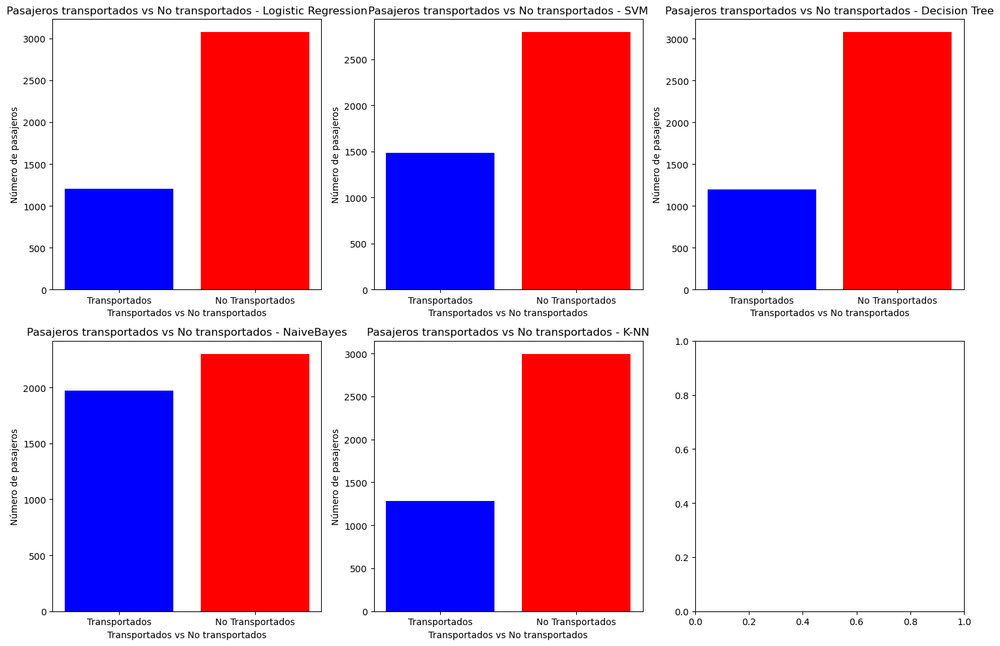

['7893_02',
 '7426_03',
 '3341_01',
 '7308_01',
 '4626_01',
 '7998_04',
 '5382_02',
 '5164_02',
 '4718_01',
 '2895_01',
 '8525_02',
 '7556_04',
 '2656_01',
 '4265_01',
 '1689_01',
 '1680_02',
 '7147_01',
 '1104_01',
 '7054_02',
 '7998_03',
 '0758_02',
 '4551_03',
 '0775_02',
 '0775_03',
 '0775_06',
 '0778_01',
 '6575_01',
 '6516_02',
 '0892_01',
 '0892_02',
 '0894_01',
 '7556_01',
 '1374_01',
 '4985_01',
 '8125_01',
 '5079_01',
 '5086_01',
 '4959_01',
 '5114_01',
 '5100_01',
 '4854_01',
 '1852_04',
 '4825_01',
 '4766_01',
 '8305_02',
 '8355_01',
 '8357_02',
 '8361_04',
 '4703_01',
 '4701_02',
 '0264_01',
 '4697_01',
 '4685_01',
 '4636_01',
 '4583_02',
 '4583_01',
 '0228_03',
 '4703_02',
 '0451_01',
 '7893_04',
 '5734_01',
 '0763_01',
 '0626_01',
 '0897_01',
 '6288_03',
 '0530_03',
 '1118_02',
 '5850_01',
 '2667_05',
 '1124_02',
 '7412_01',
 '7426_01',
 '1131_01',
 '7439_02',
 '5766_01',
 '5691_01',
 '7893_01',
 '0479_01',
 '5588_03',
 '1184_01',
 '5588_02',
 '1948_02',
 '7556_02',
 '12

In [140]:
predict_prob_transported_statistics(df_expl_clean, best_models, 0.75)

Conclusión: una vez hecho el ajuste de hiperparámetros, concluimos que el mejor modelo de los algorítmos evaluados es __Support Vector Machines (SVM)__, con los siguientes hiperparámetros:
- `C` = __1__ (__Parámetro de Regularización__): controla el equilibrio entre maximizar el margen de separación entre las clases y minimizar la clasificación errónea de los puntos de datos. Un valor más alto de `C` dará lugar a un margen más estrecho, lo que puede llevar a un ajuste más ajustado a los datos de entrenamiento. Por otro lado, un valor más bajo de `C` permitirá un margen más amplio, lo que podría permitir una cierta cantidad de puntos mal clasificados.

- `kernel` = __'poly'__: El kernel especifica la función matemática que se utiliza para transformar los datos originales en un espacio de características superior, donde se puede realizar una separación lineal o no lineal de las clases. El valor 'poly' indica que se está utilizando un kernel polinómico. Los kernels polinómicos son útiles para capturar relaciones no lineales en los datos.

- `probability` = __True__: Cuando se establece en True, este hiperparámetro permite que el modelo SVM estime probabilidades de pertenencia a cada clase en lugar de solo realizar una clasificación binaria.

### f) Comparación de los resultados obtenidos utilizando modelos de ensemble para resolver el problema.

Para ello, utilizaremos un modelo `XGBoost` (_Extreme Gradient Boosting_). Recordemos que `XGBoost` es un modelo ensemble que pertenece a la categoría de los modelos __boosting__. 

`XGBoost`es una forma avanzada de boosting que combina múltiples modelos más simples, como árboles de decisión, para crear un modelo más potente y generalizable.



#### Entrenamos un modelo SVM utilizando los mejores hiperparámetros

In [141]:
svm = SVC(C = 1, kernel = 'poly', probability = True)

svm.fit(X_train, y_train)

SVC(C=1, kernel='poly', probability=True)

#### Entrenamos un modelo XGBoost

In [142]:
# Entrenamiento del modelo de Gradient Boosting (XGBoost)
xgb_model = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3)

xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

#### Predicciones en el conjunto de test

In [143]:
# Predicciones en el conjunto de prueba

svm_predictions = svm.predict(X_test)

xgb_predictions = xgb_model.predict(X_test)

#### Evaluación de los modelos

In [144]:
# Evaluación de modelos

svm_accuracy = accuracy_score(y_test, svm_predictions)

xgb_accuracy = accuracy_score(y_test, xgb_predictions)

print(f'Accuracy del modelo SVM: {svm_accuracy:.4f}')
print(f'Accuracy del modelo XGBoost: {xgb_accuracy:.4f}')

Accuracy del modelo SVM: 0.7579
Accuracy del modelo XGBoost: 0.7608


Vemos que el ensemble `XGBoost` mejora los resultados ligeramente.

### g) Selección del mejor modelo de los testeados en los apartados anteriores.

In [145]:
def predict_prob_transported_statistics(df, model, prob, save_to_file=True, file_name=None):
    '''
    Args:
        - df: un Dataframe
        - model:
            - log: Regresión Logística
            - svm: Support Vector Machines
            - nb: Naive-Bayes
            - dt: Árbol de Decisión
            - knn: K-Vecinos
        - prob: float igual o menor a 1 que indique la probabilidad con la que asegurar los pasajeros que han sido transportados
        - save_to_file: bool que indica si deseas guardar la lista en un archivo
        - file_name: nombre del archivo donde guardar la lista (opcional)
    '''

    if model.__class__.__name__ == 'svm':
        model.probability = True

    prob_transported = model.predict_proba(df)[:, 1]

    prob_predictions_df = pd.DataFrame({
        "PassengerId": IDs_df_expl,
        "Prob_Transported": prob_transported.round(2)
    })

    prob_predictions_df = prob_predictions_df.sort_values("Prob_Transported", ascending=False)

    total_passengers = df.shape[0]
    transported_passengers_number = prob_predictions_df[prob_predictions_df["Prob_Transported"] >= prob].shape[0]
    not_transported_passengers_number = total_passengers - transported_passengers_number

    transported_passengers_list = list(prob_predictions_df[prob_predictions_df["Prob_Transported"] >= prob]['PassengerId'])

    # Gráfica de barras para comparar pasajeros transportados vs no transportados
    labels = ['Transportados', 'No Transportados']
    counts = [transported_passengers_number, not_transported_passengers_number]
    plt.bar(labels, counts, color = ['blue', 'red'])
    plt.xlabel('Transportados vs No transportados')
    plt.ylabel('Número de pasajeros')
    plt.title('Pasajeros transportados vs No transportados')
    plt.show()

    print(f'Resultados de la predicción con algorítmo {model.__class__.__name__}')
    print('---------------------------')

    print(f'Con el {prob * 100:.0f} % de probabilidad, del total de {total_passengers} pasajeros, {transported_passengers_number} pasajeros han sido transportados y {not_transported_passengers_number} no.')

    if save_to_file:
        if file_name is None:
            file_name = 'transported_passengers.txt'
        
        with open(file_name, 'w') as f:
            for passenger_id in transported_passengers_list:
                f.write(f'{passenger_id}\n')

    return transported_passengers_list

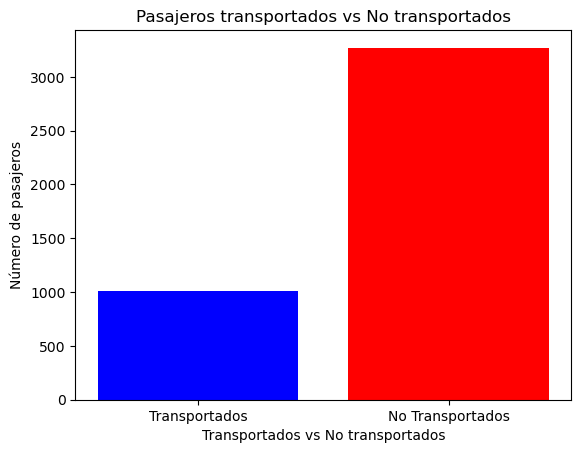

Resultados de la predicción con algorítmo XGBClassifier
---------------------------
Con el 75 % de probabilidad, del total de 4277 pasajeros, 1006 pasajeros han sido transportados y 3271 no.


['1257_02',
 '8286_01',
 '0708_02',
 '4012_02',
 '7287_01',
 '5964_02',
 '7308_01',
 '3876_03',
 '7373_01',
 '7373_02',
 '7380_02',
 '0640_02',
 '0626_02',
 '0626_01',
 '7412_01',
 '7426_01',
 '7426_03',
 '7439_02',
 '7530_01',
 '7163_02',
 '0717_07',
 '4070_01',
 '0758_02',
 '4323_01',
 '0778_01',
 '0775_06',
 '0775_03',
 '0775_02',
 '0763_01',
 '4268_01',
 '4265_01',
 '7147_01',
 '4180_01',
 '0744_01',
 '4155_01',
 '7054_02',
 '7081_02',
 '7124_02',
 '4070_02',
 '7556_01',
 '2185_01',
 '7556_02',
 '7971_01',
 '0451_01',
 '7893_04',
 '7893_05',
 '3366_01',
 '7951_01',
 '3344_01',
 '3341_01',
 '2343_01',
 '7893_01',
 '7998_02',
 '7998_03',
 '7998_04',
 '8047_01',
 '8125_01',
 '3265_03',
 '2355_02',
 '7893_02',
 '3513_01',
 '7556_04',
 '7792_02',
 '0532_02',
 '0530_03',
 '3676_01',
 '7645_01',
 '3580_02',
 '7718_01',
 '0494_01',
 '7792_03',
 '3513_02',
 '7792_05',
 '7826_01',
 '0479_01',
 '7827_01',
 '7838_01',
 '7846_02',
 '3513_04',
 '1951_01',
 '0804_01',
 '1948_02',
 '1118_02',
 '62

In [146]:
predict_prob_transported_statistics(df_expl_clean, xgb_model, 0.75)

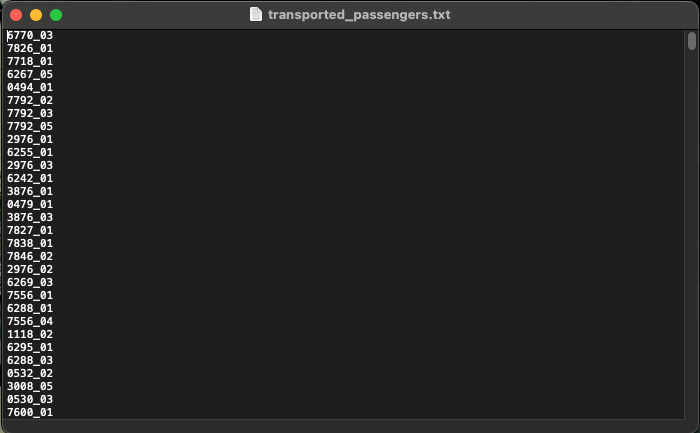


Como observamos en la captura de pantalla, la función nos exporta un txt con todos los pasajeros que han sido transportados, teniendo en cuenta el umbral que hayamos determinado.

/ / / FIN DEL EJERCICIO / / /

# Extra

Con lo aprendido en el ejercicio 2, en el cual hemos aplicado técnicas de pipeline, intentamos hacer lo mismo en este ejercicio de la siguiente manera:
- Agrupar todas las transformaciones de limpieza, categorización en intervalos, eliminación de columnas sobrantes, etc en una función llamada `cleaning`.
- Crear un pipeline con el siguiente flow:
    - Preprocessor:
        - Primero: pasarle la función `cleaning` al dataset (con un `FunctionTransformer`).
        - Segundo: pasarle un `HotEncoder` (con un `ColumnTransformer`).
    - El modelo que escojamos. 

Definimos la función `cleaning`, que agrupa toda la limpieza y transformación del dataset:

In [147]:
#Tratamiento de la variable 'cabin'
def cabin_cleaning(df):
    '''
    Función para transformar la variable Cabin. Divide la variable en tres variables, 
    diferenciando letra, número y lado en el que se encuentra el camarote.
    
    1a Parte: división de 'Cabin' en 'Cabin_Letter', 'Cabin_Number'y 'Cabin_Side' y 
    categorizació en intervalos de 'Cabin_number'.
    '''
    #Slicing y almacenamos cada valor en una variable
    df[['Cabin_Letter', 'Cabin_Number', 'Cabin_Side']] = df['Cabin'].str.split('/', expand=True)

    # Eliminar la columna original 'Cabin'
    df.drop(columns='Cabin', inplace=True)
    
    # Creamos intervalos para la variable Cabin_Number 
    df['Cabin_Number'] = pd.cut(x = df['Cabin_Number'].astype(float),
                                bins = 5,
                                right = True,
                                labels = ['Zona 1', 'Zona 2', 'Zona 3', 'Zona 4', 'Zona 5'])
    
    '''
    2a Parte: imputación de los valores faltantes de 'Cabin_Letter', 'Cabin_Number'y 'Cabin_Side'.
    Imputaremos por el método 'ffill', el valor inmediatamente posterior.
    '''
    
    #Imputamos la columna 'Cabin_Letter'
    df['Cabin_Letter'] = df['Cabin_Letter'].fillna(method = 'ffill')
   
    #Imputamos la columna 'Cabin_Number'
    df['Cabin_Number'] = df['Cabin_Number'].fillna(method = 'ffill')

    #Imputamos la columna 'Cabin_Side'
    df['Cabin_Side'] = df['Cabin_Side'].fillna(method = 'ffill')
    
    return df

#Tratamiento de la variable 'HomePlanet'
def homeplanet_cleaning(df):
    '''
    Función para limpiar e imputar los valores faltantes de HomePlanet.
    args: df de pandas
    
    1a Parte: Agrupa pasajeros según apellido, obtiene el apellido el HomePlanet correspondiente
    según su apellido e itera fila por fila, analizando si el valor es faltante en HomePlanet, y si lo es,
    asigna el valor de HomePlanet correspondiente a su apellido.
    '''
    # Creamos la variable 'Last_Name'
    df['Last_Name'] = df['Name'].str.split().str[1]
    
    # Limpiamos los espacios en blanco alrededor de los valores en la columna 'Last_Name'
    df['Last_Name'] = df['Last_Name'].str.strip()

    # Creamos un diccionario para almacenar los valores de 'HomePlanet' por apellido
    homeplanet_by_last_name = {}

    # Iteramos por cada fila del DataFrame
    for _, row in df.iterrows():
        last_name = row['Last_Name']
        homeplanet = row['HomePlanet']

        # Verificamos que el apellido no esté vacío y el valor de 'HomePlanet' no sea nulo
        if last_name and pd.notnull(homeplanet):
            # Si no hemos registrado un valor para este apellido, lo almacenamos
            if last_name not in homeplanet_by_last_name:
                homeplanet_by_last_name[last_name] = homeplanet

    # Definimos una función lambda que rellena los valores faltantes de 'HomePlanet' con el valor del apellido correspondiente
    fill_missing_homeplanet = lambda row: homeplanet_by_last_name.get(row['Last_Name'], row['HomePlanet'])

    # Rellenamos los valores faltantes de 'HomePlanet' utilizando la función lambda
    df['HomePlanet'] = df.apply(fill_missing_homeplanet, axis=1)

    #Filtramos los pasajeros con valores faltantes en 'HomePlanet'
    missing_homeplanet = df[df['HomePlanet'].isna()]
    '''
    
    2a Parte: si han quedado valores HomePlanet por rellenar, itera fila por fila e imputa
    el valor de HomePlanet de la siguiente manera:
        - Elegimos 'Earth' para pasajeros en las cabinas A, B, C, D o T
        - Elegimos 'Europa' para pasajeros en las cabinas F o G
        - Elegimos 'Mars' para pasajeros en cualquier otra cabina
        
    '''
    #Asignamos las cabinas uno a uno según las reglas
    for _, passenger in missing_homeplanet.iterrows():
        cabin = passenger['Cabin_Letter']  # Obtener la cabina del pasajero
    
        # Asignar 'HomePlanet' según la cabina
        if cabin in ['A', 'B', 'C', 'D', 'T']:
            assigned_planet = 'Earth'  # Elegimos 'Earth' para pasajeros en las cabinas A, B, C, D o T
        elif cabin in ['F', 'G']:
            assigned_planet = 'Europa'  # Elegimos 'Europa' para pasajeros en las cabinas F o G
        else:
            assigned_planet = 'Mars'  # Elegimos 'Mars' para pasajeros en cualquier otra cabina
    
        # Usar loc para asignar el planeta de origen al pasajero
        df.loc[passenger.name, 'HomePlanet'] = assigned_planet
    

    return df

#Tratamiento de la variable VIP
def cleaning_vip(df):
    
    #Rellenamos con False (NO VIP) los datos faltantes de la columna VIP
    df['VIP'] = df['VIP'].fillna(False).astype(object)
    
    return df

#Tratamiento de las variables de gasto
def cleaning_expenses(df):
    
    '''
    1a Parte: Imputa los valores faltantes de las diferentes variables de gasto
    por su media.
    
    '''
    
    #Definimos las variables de gasto
    vars_gasto = ['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']
    
    #Iteramos 
    for var in vars_gasto:
        df[var] = df[var].fillna(df[var].mean())
        
            
    '''
    2a Parte: Creamos dos nuevas variables producto de las variables de gasto:
        - 'Expense': suma todos los gastos.
        - 'ExpenseYes': booleana, indica si ha gastado o no.
    
    '''
        
    #Creamos la variable 'Expense' (cuantitativa primero) que sume todos los gastos realizados:
    df['Expense'] = df[['RoomService','FoodCourt','ShoppingMall','Spa','VRDeck']].sum(axis = 1)
    
    #Creamos la variable 'ExpenseYes' que indique con 0 no tiene gasto y con 1 si ha gastado algo
    df['ExpenseYes'] = (df['Expense'] != 0).astype(int)
    
        
    '''
    3a Parte: Categoriza en intervalos la variable 'Expense'.
    
    '''
    
    # Asignamos 'None' a los registros donde 'Expense' es igual a 0
    df.loc[df['Expense'] == 0, 'Expense_cat'] = 'None'

    # Aplicamos la función cut solo a los valores mayores que 0
    df.loc[df['Expense'] > 0, 'Expense_cat'] = pd.cut(
                                                        x = df.loc[df['Expense'] > 0, 'Expense'],
                                                        bins = 3,
                                                        labels = ['Low', 'Medium', 'High'])
    
    return df

#Tratamiento de la variable 'Age'
def cleaning_age(df):
    '''
    Función para limpiar e imputar los valores faltantes de 'Age' y categorizar en intervalos.
    
    1a Parte: imputación de valores faltantes por su media.
    '''
    
    #Imputamos los valores faltantes por la media
    df['Age'] = df['Age'].fillna(df['Age'].mean())
    
    '''
    2a Parte: categorización en intervalos
    '''
    
    # Definimos los límites y etiquetas para los intervalos
    bins = [0, 10, 20, 30, 40, 50, 60, 70, float('inf')]
    labels = ['Menor de 10 años', 'Entre 10 y 19 años', 'Entre 20 y 29 años', 'Entre 30 y 39 años', 
          'Entre 40 y 49 años', 'Entre 50 y 59 años', 'Entre 60 y 69 años', 'Entre 70 y 79 años']

    # Categorizamos la variable 'Age' en los intervalos definidos
    df['Age_cat'] = pd.cut(x = df['Age'], 
                                 bins = bins, 
                                 labels = labels, 
                                 right = False)
    
    return df

#Tratamiento de la variable 'Cryosleep'
def cleaning_cryosleep(df):
    '''
    Función para limpiar e imputar los valores faltantes ded 'Cryosleep',
    siguiendo la siguiente estrategia:
    - Si ha gastado algo, Cryosleep = False
    - Si no ha gastado...
        - Si es mayor de edad, Cryosleep = True
        - Si es menor de edad, Cryosleep = False
    '''
    for index, row in df.iterrows():
        if pd.isna(row['CryoSleep']):
            if pd.notna(row['Expense']):
                df.loc[index, 'CryoSleep'] = False
            elif pd.notna(row['Age']) and row['Age'] >= 18:
                df.loc[index, 'CryoSleep'] = True
            else:
                df.loc[index, 'CryoSleep'] = False
                
    return df

#Tratamiento de la variable 'destination'
def cleaning_destination(df):
    '''
    Función para imputar los valores faltantes en 'Destination' basados 
    en las proporciones del DataFrame
    '''
    
    # Calculamos las proporciones de cada destinación
    proportions = df['Destination'].value_counts(normalize=True) 
    
    # Reemplazamos los valores faltantes en 'Destination' utilizando las proporciones
    df['Destination'] = df['Destination'].fillna(pd.Series(np.random.choice(proportions.index, p=proportions.values, size=len(df))))
    
    return df

#Tratamiento de outliers ('Age' y variables de gasto)
def cleaning_outliers(df):
    '''
    Función para imputar a 0 los valores atípicos en la columna 'Expense' de aquelos pasajeros menos de una edad límite.
    En este caso consideramos la edad límite razonable para gastar 10 años.
    '''
    
    df.loc[df['Age'] < 10, ['Expense', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']] = 0
    df.loc[df['Age'] < 10, 'ExpenseYes'] = False
    
    return df

#Tratamiento para eliminar variables no necesarias
def cleaning_remove(df):
    
    '''
    Función que elimina las variables de una lista
    '''
    
    #Definimos las variables a eliminar
    cols_to_remove = ['PassengerId', 'Age', 'Last_Name', 'Name', 'Expense', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']
    
    #Aplicamos eliminación
    df.drop(cols_to_remove, axis = 1, inplace = True)
    
    return df

#Recopilamos todas las funciones de limpieza en una
def cleaning(df):
    
    df = cabin_cleaning(df)
    
    df = homeplanet_cleaning(df)
    
    df = cleaning_vip(df)
    
    df = cleaning_expenses(df)
    
    df = cleaning_age(df)
    
    df = cleaning_cryosleep(df)
    
    df = cleaning_destination(df)
    
    df = cleaning_outliers(df)
    
    df = cleaning_remove(df)
    
    return df

Recordamos que le vamos a pasar la función `cleaning`. Después de la función de limpieza todo el dataset tiene las columnas categóricas y no tiene valores faltantes. Después codificarimos las columnas con HotEncoding. Se vería así después de la función de limpieza y antes de codificarlo:

In [148]:
df_cons = pd.read_csv('./datasets/spaceship_alcon_train.csv')

#Limpieza y transformación del dataset
df_cons_cleaned = cleaning(df_cons)

df_cons_cleaned.head()

,HomePlanet,CryoSleep,Destination,VIP,Transported,Cabin_Letter,Cabin_Number,Cabin_Side,ExpenseYes,Expense_cat,Age_cat
0,Europa,False,TRAPPIST-1e,False,False,B,Zona 1,P,0,None,Entre 30 y 39 años
1,Earth,False,TRAPPIST-1e,False,True,F,Zona 1,S,1,Low,Entre 20 y 29 años
2,Europa,False,TRAPPIST-1e,True,False,A,Zona 1,S,1,Low,Entre 50 y 59 años
3,Europa,False,TRAPPIST-1e,False,False,A,Zona 1,S,1,Low,Entre 30 y 39 años
4,Earth,False,TRAPPIST-1e,False,True,F,Zona 1,S,1,Low,Entre 10 y 19 años


Ahora creamos el pipeline, desde la carga hasta la evaluación del modelo. Tendremos en cuento los siguientes modelos:
- Random Forest Classifier.
- Suport Vector Machines.
- XGBoost.

El código da error. Parece ser que el error está en el paso de aplicar el HotEncoding. Quitando la parte del codificador, si hago un pipeline con solo el `FunctionTransformer` de la función `cleaning`, si hacemos un `pipeline.fit_transform(df_cons)`, el pipeline nos devuelve el dataset limpio. 

Si le pasamos la función `cleaning` antes, y luego el HotEncoding como parte de un pipeline, si funciona. (código en el siguiente box después del error):


**Nos gustaría saber la correción**.

Primero les mostramos el **pipeline deseado** y luego el **pipeline que nos ha funcionado**.

##### Pipeline deseado

In [149]:
start_time = time.time()

# Carga del dataset
df_cons = pd.read_csv('./datasets/spaceship_alcon_train.csv')

# Dividimos los datos en conjuntos de entrenamiento y prueba
X = df_cons.drop('Transported', axis=1)
y = df_cons['Transported']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Identifica las columnas categóricas
categorical_columns = [col for col in X.columns if X[col].dtype == 'object']

# Preprocesado (preprocessor)
# Crea un transformador basado en la función 'cleaning'
cleaning_transformer = FunctionTransformer(func=cleaning)

# Create the ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cleaning', cleaning_transformer, X.columns),
        ('HotEncoder', OneHotEncoder(handle_unknown='ignore'), categorical_columns),
    ],
    remainder='passthrough'  # Mantener las columnas numéricas intactas
)

# Create the pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor)
])

# Creación del pipeline
pipe_rfc = Pipeline([
    ('preprocessor', preprocessor),  # Aplica la codificación One-Hot
    ('RandomForest', RandomForestClassifier())  # Modelo RandomForest
])

# Creación del pipeline
pipe_svm = Pipeline([
    ('preprocessor', preprocessor),  # Aplica la codificación One-Hot
    ('SVM', SVC())  # Modelo
])

# Creación del pipeline
pipe_xgb = Pipeline([
    ('preprocessor', preprocessor),  # Aplica la codificación One-Hot
    ('XGBoost', XGBClassifier(n_estimators=100, 
                              learning_rate=0.1, 
                              max_depth=3))
])


# Entrena el modelo en el conjunto de entrenamiento
pipe_rfc.fit(X_train, y_train)
pipe_svm.fit(X_train, y_train)
pipe_xgb.fit(X_train, y_train)

# Puedes evaluar el rendimiento del modelo, por ejemplo, usando métricas de clasificación
print("Accuracy RFC:", accuracy_score(y_test, pipe_rfc.predict(X_test)).round(2))
print('-----------------')
print(classification_report(y_test, pipe_rfc.predict(X_test)))
print()
print("Accuracy SVM:", accuracy_score(y_test, pipe_svm.predict(X_test)).round(2))
print('-----------------')
print(classification_report(y_test, pipe_svm.predict(X_test)))
print()
print("Accuracy XGBoost:", accuracy_score(y_test, pipe_xgb.predict(X_test)).round(2))
print('-----------------')
print(classification_report(y_test, pipe_xgb.predict(X_test)))

# Registra el tiempo de finalización
end_time = time.time()

# Calcula la diferencia de tiempo
execution_time = round((end_time - start_time), 2)

# Imprime el tiempo de ejecución en segundos
print(f'Tiempo de ejecución: {execution_time} segundos')

ValueError: For a sparse output, all columns should be a numeric or convertible to a numeric.

##### Pipeline que nos ha funcionado

In [150]:
start_time = time.time()

# Carga del dataset
df_cons = pd.read_csv('./datasets/spaceship_alcon_train.csv')

#Limpieza y transformación del dataset
df_cons_cleaned = cleaning(df_cons)

# Dividimos los datos en conjuntos de entrenamiento y prueba
X = df_cons_cleaned.drop('Transported', axis=1)
y = df_cons_cleaned['Transported']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creación del pipeline
pipe_rfc = Pipeline([
    ('HotEncoder', OneHotEncoder()),  # Aplica la codificación One-Hot
    ('RandomForest', RandomForestClassifier())  # Modelo RandomForest
])

# Creación del pipeline
pipe_svm = Pipeline([
    ('HotEncoder', OneHotEncoder()),  # Aplica la codificación One-Hot
    ('SVM', SVC())  # Modelo
])

# Creación del pipeline
pipe_xgb = Pipeline([
    ('HotEncoder', OneHotEncoder()),  # Aplica la codificación One-Hot
    ('XGBoost', XGBClassifier(n_estimators=100, 
                              learning_rate=0.1, 
                              max_depth=3))
])


# Entrena el modelo en el conjunto de entrenamiento
pipe_rfc.fit(X_train, y_train)
pipe_svm.fit(X_train, y_train)
pipe_xgb.fit(X_train, y_train)

# Puedes evaluar el rendimiento del modelo, por ejemplo, usando métricas de clasificación
print("Accuracy RFC:", accuracy_score(y_test, pipe_rfc.predict(X_test)).round(2))
print('-----------------')
print(classification_report(y_test, pipe_rfc.predict(X_test)))
print()
print("Accuracy SVM:", accuracy_score(y_test, pipe_svm.predict(X_test)).round(2))
print('-----------------')
print(classification_report(y_test, pipe_svm.predict(X_test)))
print()
print("Accuracy XGBoost:", accuracy_score(y_test, pipe_xgb.predict(X_test)).round(2))
print('-----------------')
print(classification_report(y_test, pipe_xgb.predict(X_test)))

# Registra el tiempo de finalización
end_time = time.time()

# Calcula la diferencia de tiempo
execution_time = round((end_time - start_time), 2)

# Imprime el tiempo de ejecución en segundos
print(f'Tiempo de ejecución: {execution_time} segundos')

Accuracy RFC: 0.73
-----------------
              precision    recall  f1-score   support

       False       0.70      0.77      0.74       861
        True       0.75      0.68      0.71       878

    accuracy                           0.73      1739
   macro avg       0.73      0.73      0.73      1739
weighted avg       0.73      0.73      0.73      1739


Accuracy SVM: 0.76
-----------------
              precision    recall  f1-score   support

       False       0.73      0.80      0.77       861
        True       0.79      0.72      0.75       878

    accuracy                           0.76      1739
   macro avg       0.76      0.76      0.76      1739
weighted avg       0.76      0.76      0.76      1739


Accuracy XGBoost: 0.77
-----------------
              precision    recall  f1-score   support

       False       0.74      0.81      0.78       861
        True       0.80      0.72      0.76       878

    accuracy                           0.77      1739
   macro av